**a. To run this notebook in Google Colab, open the notebook in Colab (<a href="https://colab.research.google.com/github/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/CNN_Keras_lab_2.ipynb" target="_blank">[this link]</a>), select GPU as execution type, then run the following code:**

In [1]:
%cd /content
!git clone https://github.com/NBISweden/workshop-neural-nets-and-deep-learning
%cd /content/workshop-neural-nets-and-deep-learning/session_convolutionalNeuralNetworks/Labs/
!unzip data.zip

Streaming output truncated to the last 5000 lines.
 extracting: data/mnist/train/9/1820.png  
 extracting: data/mnist/train/9/18211.png  
  inflating: data/mnist/train/9/18228.png  
 extracting: data/mnist/train/9/18241.png  
 extracting: data/mnist/train/9/18251.png  
 extracting: data/mnist/train/9/1826.png  
 extracting: data/mnist/train/9/18277.png  
 extracting: data/mnist/train/9/18296.png  
  inflating: data/mnist/train/9/183.png  
 extracting: data/mnist/train/9/18350.png  
 extracting: data/mnist/train/9/18355.png  
 extracting: data/mnist/train/9/18374.png  
 extracting: data/mnist/train/9/18377.png  
  inflating: data/mnist/train/9/18382.png  
 extracting: data/mnist/train/9/18387.png  
 extracting: data/mnist/train/9/18401.png  
 extracting: data/mnist/train/9/18405.png  
 extracting: data/mnist/train/9/18415.png  
 extracting: data/mnist/train/9/18437.png  
 extracting: data/mnist/train/9/18441.png  
 extracting: data/mnist/train/9/18448.png  
 extracting: data/mnist/train

**b. To run this notebook locally on Jupyter Notebook, use the following command:**
```bash
curl -o CNN_Keras_lab_2.ipynb https://raw.githubusercontent.com/NBISweden/workshop-neural-nets-and-deep-learning/master/session_convolutionalNeuralNetworks/Labs/CNN_Keras_lab_2.ipynb
```
or download the page from [here](https://raw.githubusercontent.com/NBISweden/workshop-neural-nets-and-deep-learning/master/session_convolutionalNeuralNetworks/Labs/CNN_Keras_lab_2.ipynb)

In [2]:
# This lab needs the segmentation_models library, install via pip:
!pip install segmentation_models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 982.6 kB/s eta 0:00:00


# CNN Lab 2: Segmentation of Human Blood Cells using Convolutional Neural Networks

For this lab, we use the [Human White Blood Cell images](https://github.com/zxaoyou/segmentation_WBC) from [Jiangxi Tecom Science Corporation, China](http://en.tecom-cn.com/).

<img src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/WhiteBloodCells.png?raw=1" width="500px" title="Blood cell illustration (Wikipedia)" align="center"/>
<center><i>(Illustration from <a href="https://en.wikipedia.org/wiki/White_blood_cell">Wikipédia</a>)</i></center>

<br/>
The dataset contains three hundred 120x120 RGB images with one blood cell per image, and corresponding segmentation masks. The segmentation mask was manually sketched by domain experts, with the background, cytoplasms and nuclei pixels labelled as 0, 1 and 2 respectively.

<img src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/WBC_Dataset1.png?raw=1" title="Blood cells dataset" align="center"/>

These images and masks are in the **data/bloodcells_seg/** folder:
```
└── data
    └── bloodcells_seg
        ├── masks
        │   ├── all
        └── images
            ├── all
```

We want to use convolutional neural networks to do pixel-wise classification of these blood cells images into background / cytoplasm / nuclei.

In [3]:
# First we import useful modules like numpy and Keras layers

import numpy as np

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.layers import BatchNormalization, Dropout, Activation, Input
from tensorflow.keras.layers import Conv2DTranspose, concatenate, UpSampling2D

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# cnn_helper contains some useful functions for this lab
import cnn_helper

import tensorflow as tf
import matplotlib.pyplot as plt

We will load both the images and the masks as generators, and combine both generators into a zip of generators.

In [4]:
IMG_SIZE = 128
NUM_CLASSES = 3 # Background, cytoplasm, nuclei
N_CHANNELS = 3  # R,G,B
BATCH_SIZE = 8  # You can tune this and see which batch size runs faster / gives the best accuracy.

seed = 909 # (IMPORTANT) to transform image and corresponding mask with same augmentation parameter.
image_datagen = ImageDataGenerator(
    validation_split=0.2,
    rescale=1./255 #We need to rescale png images from 0-255 integers to 0.0-1.0 floats.
)
mask_datagen = ImageDataGenerator(
    validation_split=0.2
)

# Load image and mask generators for training:
train_image_generator = image_datagen.flow_from_directory(
    directory='data/bloodcells_seg/images/',
    batch_size=BATCH_SIZE,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode=None,
    seed=seed,
    subset='training',
    color_mode='rgb',
    shuffle=False)
# Note: the class_mode is used when the class is extracted from the directory
# structure. Here the class will be defined by the mask from the generator below,
# so we add class_mode: None

train_mask_generator = mask_datagen.flow_from_directory(
    directory='data/bloodcells_seg/masks/',
    batch_size=BATCH_SIZE,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode=None,
    seed=seed,
    subset='training',
    color_mode='grayscale',
    shuffle=False)

train_generator = zip(train_image_generator, train_mask_generator)

# Load image and mask  generators for validation:
val_image_generator = image_datagen.flow_from_directory(
    directory='data/bloodcells_seg/images/',
    batch_size=BATCH_SIZE,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode=None,
    seed=seed,
    subset='validation',
    color_mode='rgb',
    shuffle=False)

val_mask_generator = mask_datagen.flow_from_directory(
    directory='data/bloodcells_seg/masks/',
    batch_size=BATCH_SIZE,
    target_size=(IMG_SIZE,IMG_SIZE),
    class_mode=None,
    seed=seed,
    subset='validation',
    color_mode='grayscale',
    shuffle=False)

val_generator = zip(val_image_generator, val_mask_generator)

Found 240 images belonging to 1 classes.
Found 240 images belonging to 1 classes.
Found 60 images belonging to 1 classes.
Found 60 images belonging to 1 classes.


We can now check that the generators deliver our data:

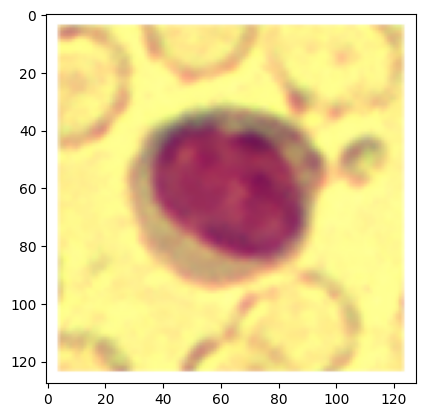

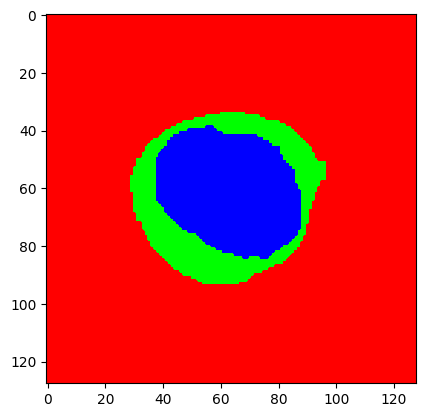

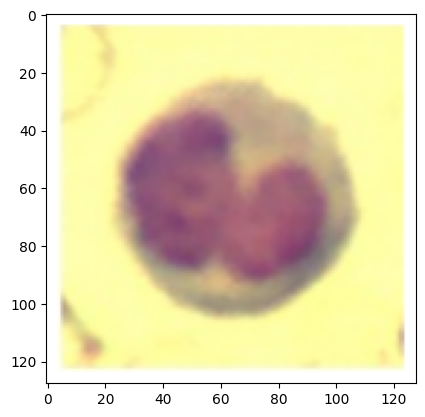

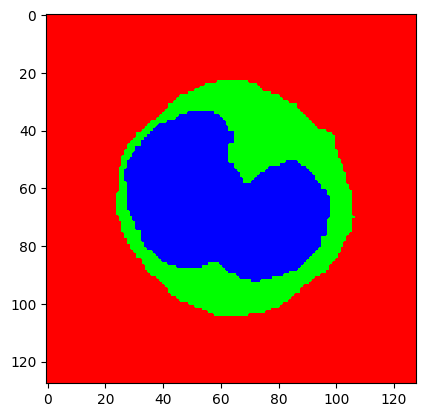

In [5]:
from matplotlib.colors import ListedColormap
cMap = ListedColormap(['red', 'lime', 'blue'])

images,masks = next(train_generator)
for i in range(0,2):
    plt.figure()
    plt.imshow(images[i], cmap=cMap)
    plt.figure()
    plt.imshow(masks[i,:,:,0], cmap=cMap)

# Building a UNet Model

<img src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/unet.png?raw=1" title="Unet model"/>

This time we will use the Keras functional API to build our model:

In [6]:
inputs = Input((IMG_SIZE, IMG_SIZE, N_CHANNELS))

c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (inputs)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (c9)

outputs = Conv2D(NUM_CLASSES, (1, 1), activation='softmax') (c9)

We use the **ELU** activation function, as the negative values and the smooth transition from negative to positive helps us have faster results in a low number of epochs. But you can try other activations functions easily:
<img src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/Activations.png?raw=1" width="400px"/>
You can visualize differences between activation functions with this online tool from [Justin Emery](https://tech.courses/author/justinjustinemery-co-uk/):

In [7]:
from IPython.display import IFrame
IFrame('https://polarisation.github.io/tfjs-activation-functions/', width=860, height=470)

As our ground truth is represented by integers on a mask (0 for background, 1 for cytoplasm, 2 for nuclei pixels) and not hot-one encoded, we will use the Keras SparseCategoricalCrossentropy loss function (see https://www.tensorflow.org/api_docs/python/tf/keras/losses/SparseCategoricalCrossentropy).

In [11]:
model = Model(inputs=[inputs], outputs=[outputs])

model.compile(optimizer=Adam(learning_rate=0.0001), loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

For training, we add a callback function that will plot `num_plot` results from validation after each epoch, to follow in real time the training of our network.

<i>A callback function is a function that is called when some events are raised. Here, the function will be called after each epoch, and will plot example of prediction from the validation set.</i>

Epoch 1/20
1/1 [==============================] - 0s 260ms/step


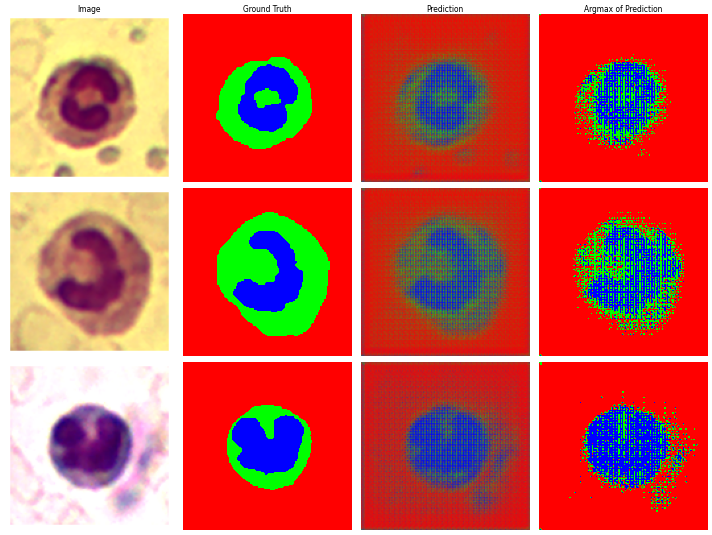

30/30 [==============================] - 18s 118ms/step - loss: 0.7984 - accuracy: 0.7901 - val_loss: 0.4597 - val_accuracy: 0.8242
Epoch 2/20
1/1 [==============================] - 0s 30ms/step


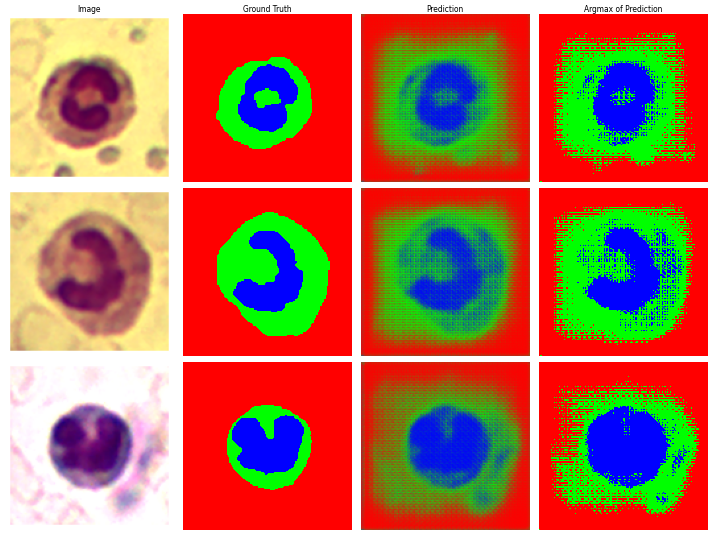

30/30 [==============================] - 2s 58ms/step - loss: 0.3585 - accuracy: 0.7764 - val_loss: 0.4580 - val_accuracy: 0.5824
Epoch 3/20
1/1 [==============================] - 0s 20ms/step


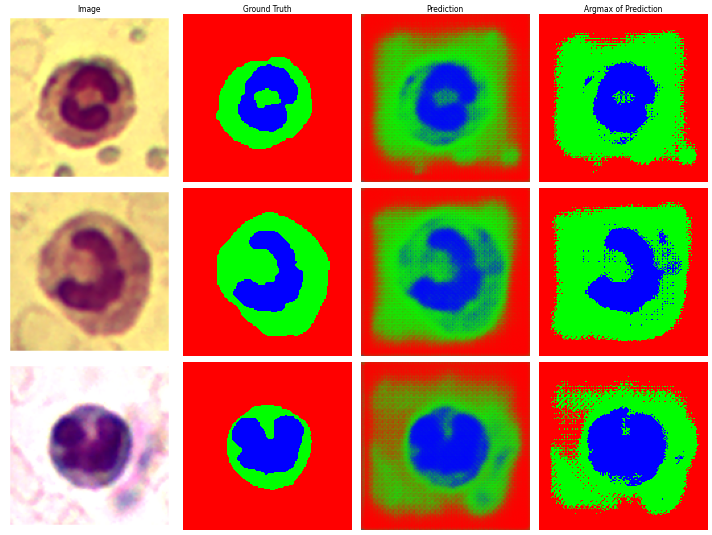

30/30 [==============================] - 2s 60ms/step - loss: 0.2321 - accuracy: 0.7395 - val_loss: 0.4628 - val_accuracy: 0.5359
Epoch 4/20
1/1 [==============================] - 0s 27ms/step


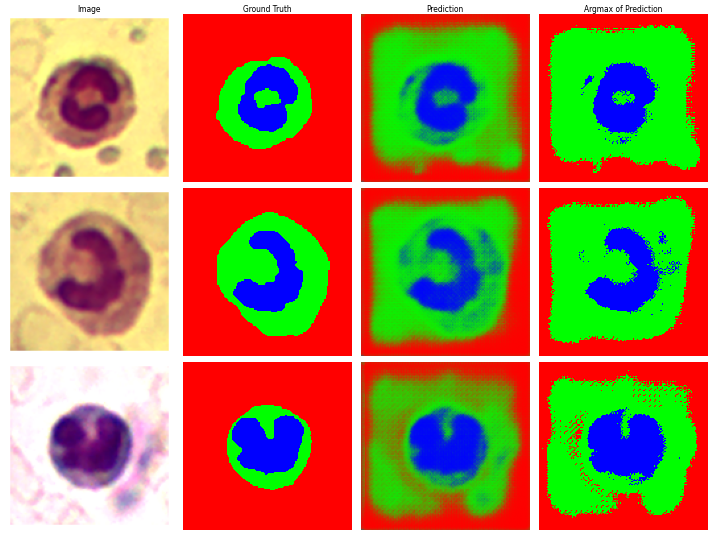

30/30 [==============================] - 3s 96ms/step - loss: 0.1964 - accuracy: 0.7343 - val_loss: 0.6457 - val_accuracy: 0.4373
Epoch 5/20
1/1 [==============================] - 0s 19ms/step


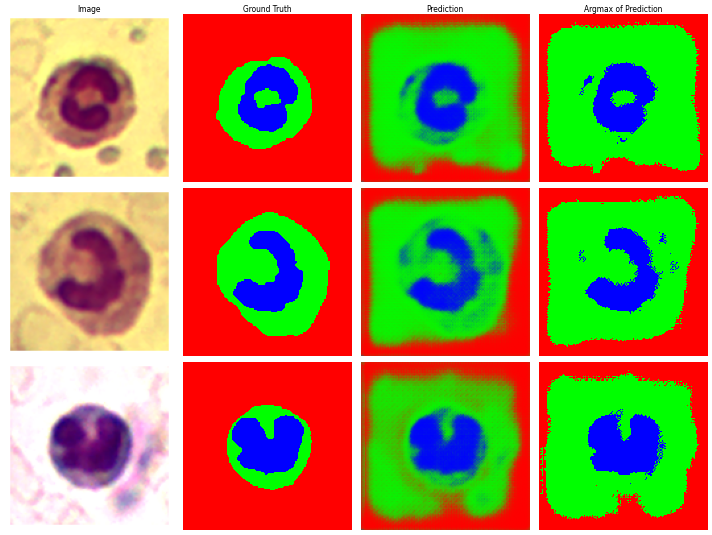

30/30 [==============================] - 2s 64ms/step - loss: 0.1667 - accuracy: 0.7296 - val_loss: 0.9085 - val_accuracy: 0.3625
Epoch 6/20
1/1 [==============================] - 0s 19ms/step


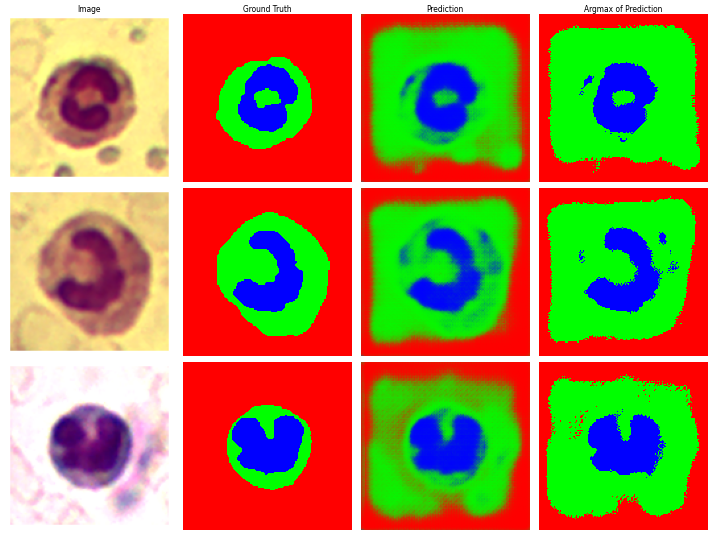

30/30 [==============================] - 2s 61ms/step - loss: 0.1500 - accuracy: 0.7281 - val_loss: 0.8318 - val_accuracy: 0.3908
Epoch 7/20
1/1 [==============================] - 0s 20ms/step


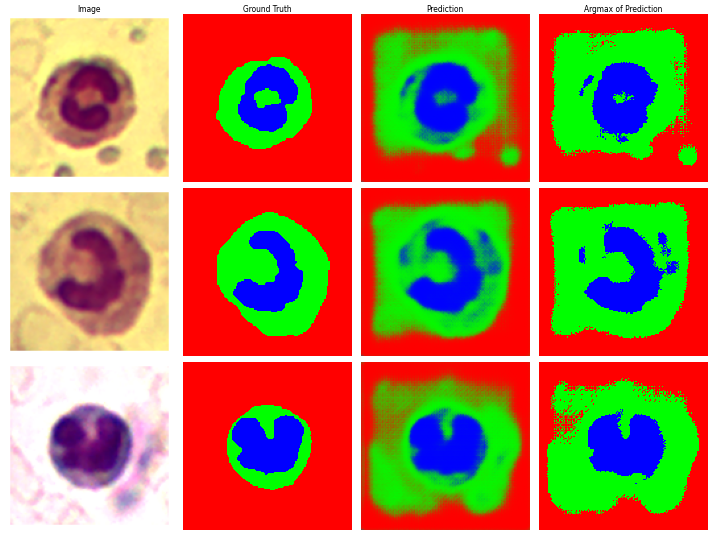

30/30 [==============================] - 2s 61ms/step - loss: 0.1359 - accuracy: 0.7280 - val_loss: 0.6062 - val_accuracy: 0.4850
Epoch 8/20
1/1 [==============================] - 0s 21ms/step


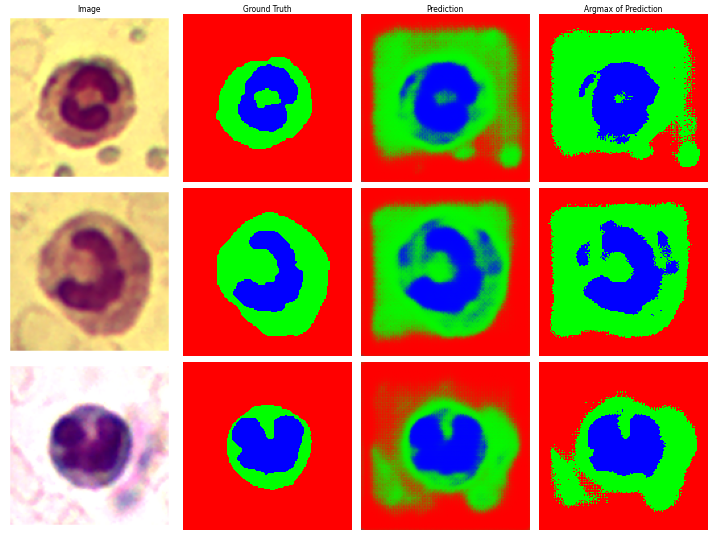

30/30 [==============================] - 2s 62ms/step - loss: 0.1317 - accuracy: 0.7290 - val_loss: 0.5779 - val_accuracy: 0.5171
Epoch 9/20
1/1 [==============================] - 0s 20ms/step


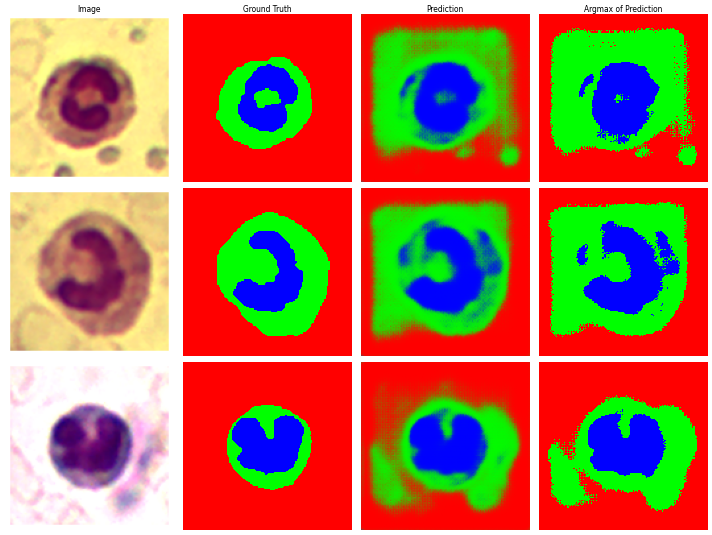

30/30 [==============================] - 2s 63ms/step - loss: 0.1150 - accuracy: 0.7269 - val_loss: 0.6242 - val_accuracy: 0.5040
Epoch 10/20
1/1 [==============================] - 0s 30ms/step


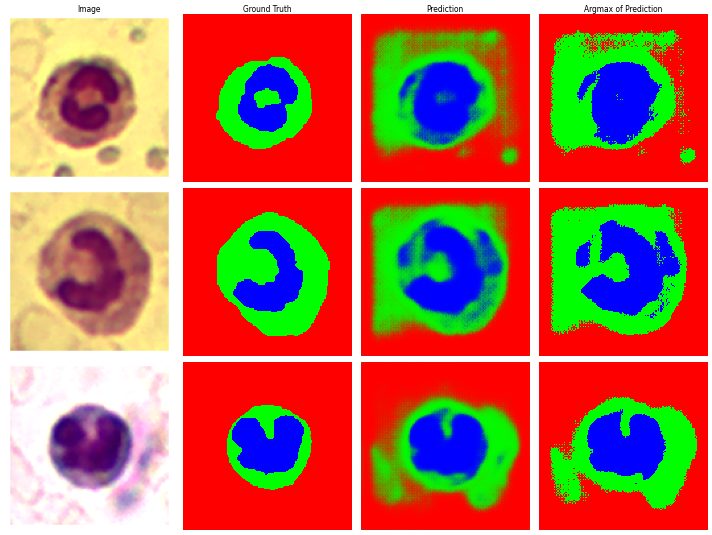

30/30 [==============================] - 2s 83ms/step - loss: 0.1090 - accuracy: 0.7268 - val_loss: 0.5494 - val_accuracy: 0.5455
Epoch 11/20
1/1 [==============================] - 0s 45ms/step


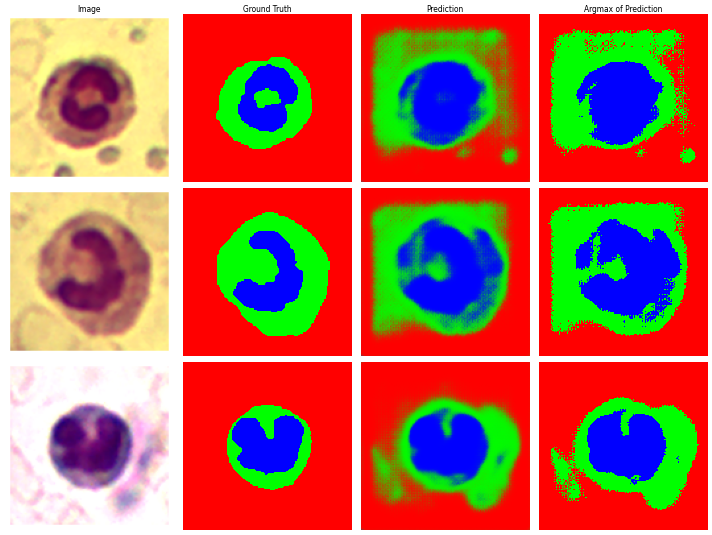

30/30 [==============================] - 3s 85ms/step - loss: 0.1004 - accuracy: 0.7268 - val_loss: 0.6323 - val_accuracy: 0.5342
Epoch 12/20
1/1 [==============================] - 0s 27ms/step


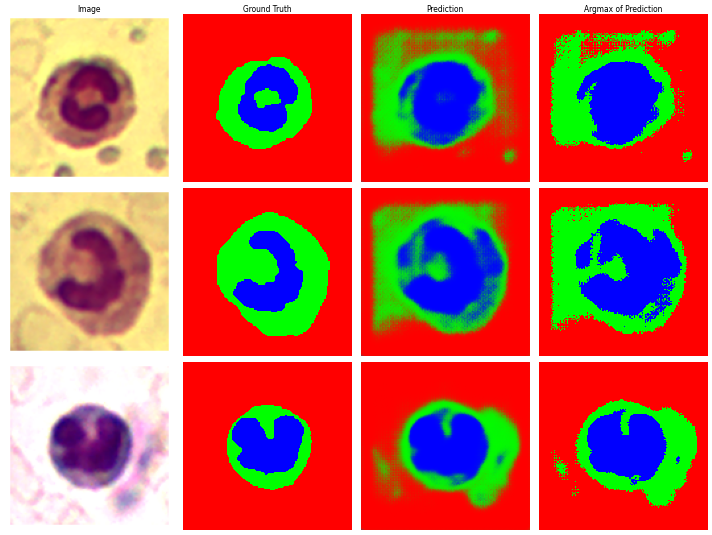

30/30 [==============================] - 2s 72ms/step - loss: 0.0963 - accuracy: 0.7262 - val_loss: 0.5247 - val_accuracy: 0.5755
Epoch 13/20
1/1 [==============================] - 0s 20ms/step


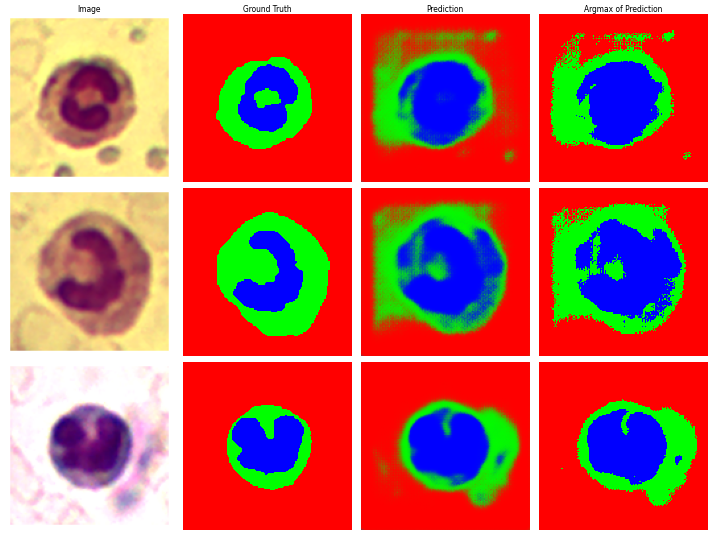

30/30 [==============================] - 2s 67ms/step - loss: 0.0912 - accuracy: 0.7264 - val_loss: 0.5216 - val_accuracy: 0.5944
Epoch 14/20
1/1 [==============================] - 0s 30ms/step


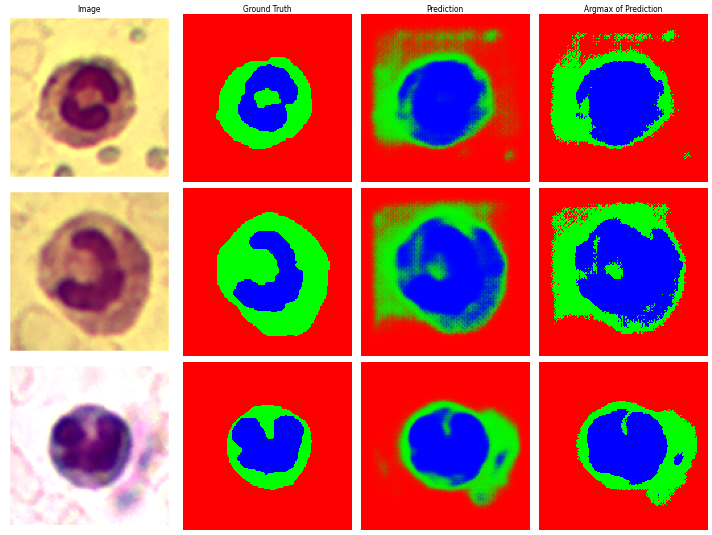

30/30 [==============================] - 2s 66ms/step - loss: 0.0887 - accuracy: 0.7266 - val_loss: 0.5452 - val_accuracy: 0.6005
Epoch 15/20
1/1 [==============================] - 0s 19ms/step


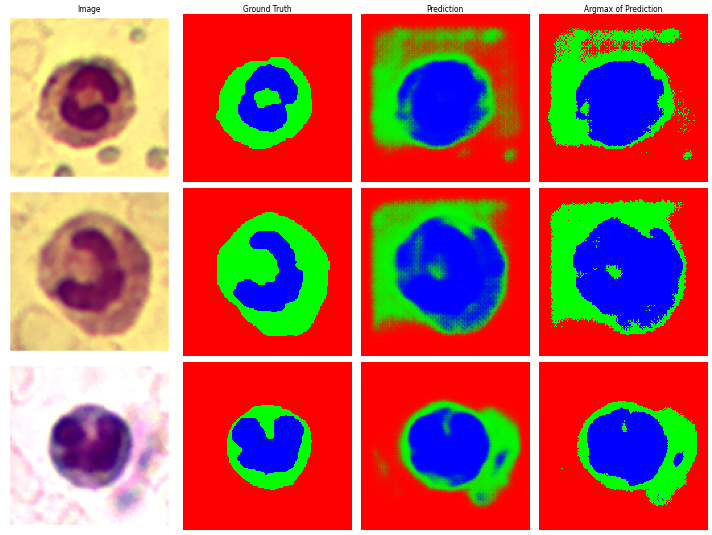

30/30 [==============================] - 2s 80ms/step - loss: 0.0865 - accuracy: 0.7263 - val_loss: 0.6613 - val_accuracy: 0.5709
Epoch 16/20
1/1 [==============================] - 0s 20ms/step


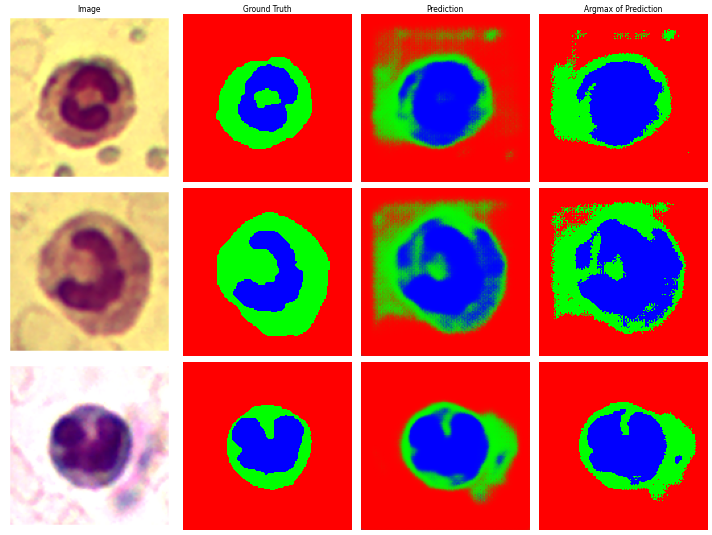

30/30 [==============================] - 2s 71ms/step - loss: 0.0852 - accuracy: 0.7268 - val_loss: 0.4115 - val_accuracy: 0.6376
Epoch 17/20
1/1 [==============================] - 0s 45ms/step


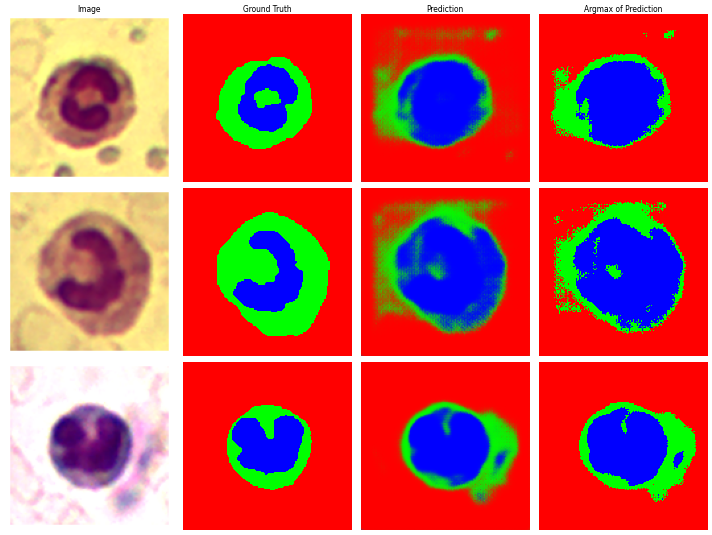

30/30 [==============================] - 3s 88ms/step - loss: 0.0815 - accuracy: 0.7260 - val_loss: 0.4670 - val_accuracy: 0.6537
Epoch 18/20
1/1 [==============================] - 0s 46ms/step


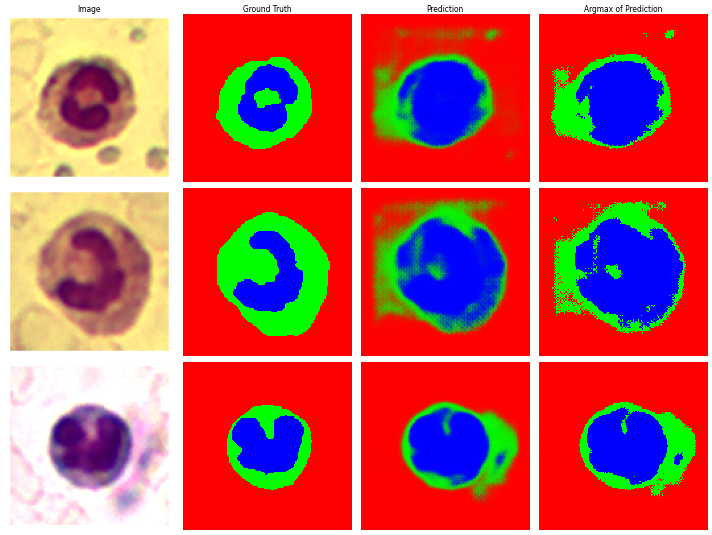

30/30 [==============================] - 3s 90ms/step - loss: 0.0774 - accuracy: 0.7263 - val_loss: 0.4424 - val_accuracy: 0.6540
Epoch 19/20
1/1 [==============================] - 0s 28ms/step


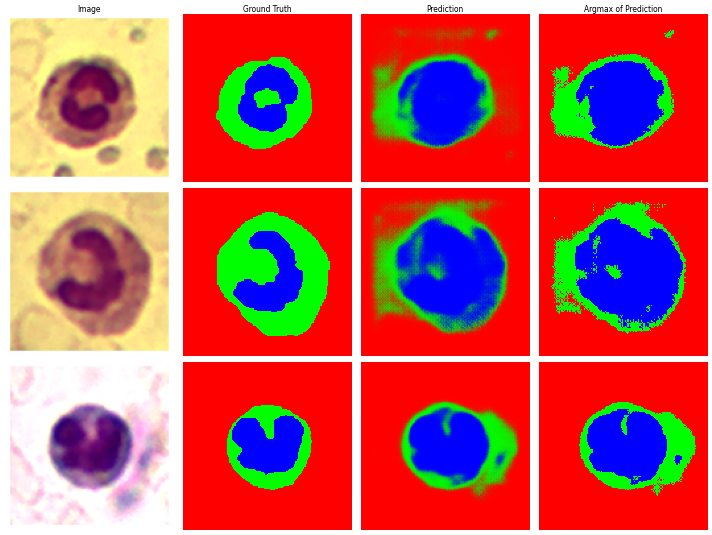

30/30 [==============================] - 2s 84ms/step - loss: 0.0750 - accuracy: 0.7267 - val_loss: 0.4310 - val_accuracy: 0.6548
Epoch 20/20
1/1 [==============================] - 0s 28ms/step


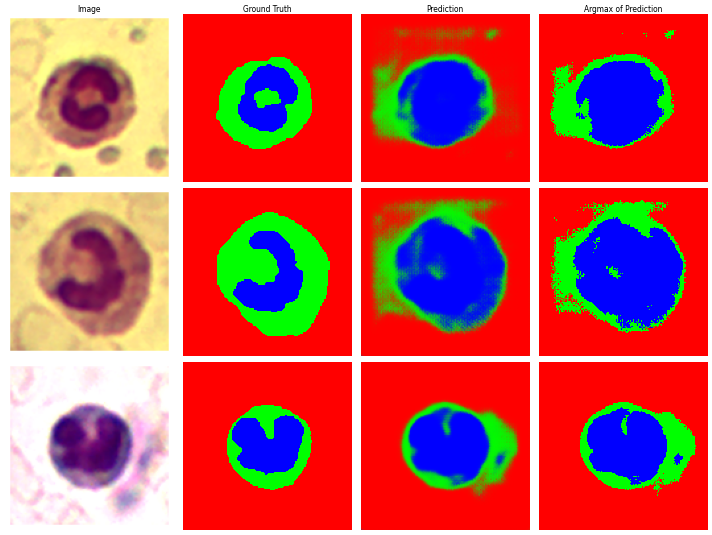

30/30 [==============================] - 2s 79ms/step - loss: 0.0736 - accuracy: 0.7266 - val_loss: 0.4588 - val_accuracy: 0.6541


In [10]:
plot_callback = cnn_helper.PlottingKerasCallback(
    test_batch=next(val_generator),
    num_plot=3 # how many validation examples to plot at each epoch (maximum = BATCH_SIZE)
)

model.fit(
    train_generator,
    steps_per_epoch=240/BATCH_SIZE,
    epochs=20,
    validation_data=(val_generator),
    validation_steps=64/BATCH_SIZE,
    callbacks=[plot_callback]
)

We can now plot some other examples from validation:

1/1 [==============================] - 0s 254ms/step


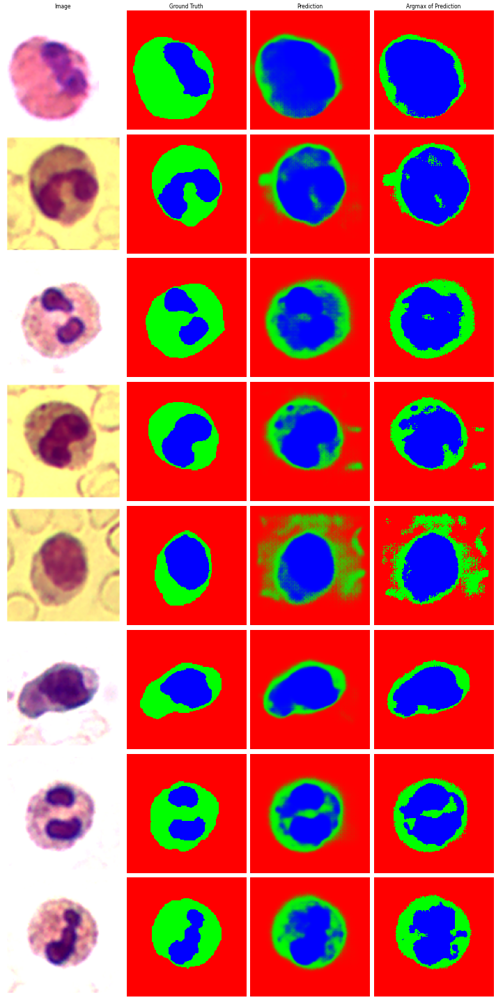

In [12]:
cnn_helper.plot_prediction (model, next(val_generator), BATCH_SIZE)

## Tuning of the model
You can now try to tune your model by changing the learning rate of the Adam optimizer, the dropout, the batch size, or any other parameter you want.

# Other models

To simplify the construction of our networks, we will now use the `segmentation_model` python library (install using `pip install segmentation_model`).

The main features of this library are:
 - High level API (just two lines of code to create model for segmentation)
 - 4 models architectures for binary and multi-class image segmentation (including legendary Unet)
 - 25 available backbones for each architecture

You can read more about the `segmentation_model` library at https://github.com/qubvel/segmentation_models.

## List of models:

| Unet | Linknet |
| --- | --- |
| <img width="500px" src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/_unet.png?raw=1" title="UNet"/> | <img width="500px" src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/_linknet.png?raw=1" title="Linknet"/> |

| PSPNet | FPN |
| --- | --- |
| <img width="500px" src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/_pspnet.png?raw=1" title="UNet"/> | <img width="500px" src="https://github.com/NBISweden/workshop-neural-nets-and-deep-learning/blob/master/session_convolutionalNeuralNetworks/Labs/illustrations/_fpn.png?raw=1" title="Linknet"/> |

## List of backbones:

| Type | Names |
| --- | --- |
| VGG | `vgg16` `vgg19` |
| ResNet | `resnet18` `resnet34` `resnet50` `resnet101` `resnet152` |
| SE-ResNet | `seresnet18` `seresnet34` `seresnet50` `seresnet101` `seresnet152` |
| ResNeXt | `resnext50` `resnext101` |
| SE-ResNeXt | `seresnext50` `seresnext101` |
| SENet154 | `senet154` |
| DenseNet | `densenet121` `densenet169` `densenet201` |
| Inception | `inceptionv3` `inceptionresnetv2` |
| MobileNet | `mobilenet` `mobilenetv2` |
| EfficientNet | `efficientnetb0` `efficientnetb1` `efficientnetb2` `efficientnetb3` `efficientnetb4` `efficientnetb5` `efficientnetb6` `efficientnetb7` |

In [13]:
# This is needed for the segmentation_model library
import os
os.environ["SM_FRAMEWORK"]="tf.keras"

import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


You can try different models and backbone from the list above.

<i>U-Net and Link-Net are very similar and generally used for the kind of segmentation we have here.<br/> FPN (Feature Pyramid Networks) are mainly used for object detection, and PSPNet (Pyramid Scene Parsing Networks) are not covered here, but you can read about them on https://towardsdatascience.com/review-pspnet-winner-in-ilsvrc-2016-semantic-segmentation-scene-parsing-e089e5df177d.

In [14]:
# Let's load the Unet model, using the VGG16 backbone
model = sm.Unet(
    'vgg16',
    encoder_weights=None,
    classes=NUM_CLASSES,
    activation='softmax',
    input_shape=(IMG_SIZE,IMG_SIZE,3)
)

print (model.summary())

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 128, 128, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 128, 128, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)           0         ['block1_conv2[0][0]']        
                                                                                            

### We can now compile and train with the same parameters as before:

Epoch 1/30
1/1 [==============================] - 0s 316ms/step


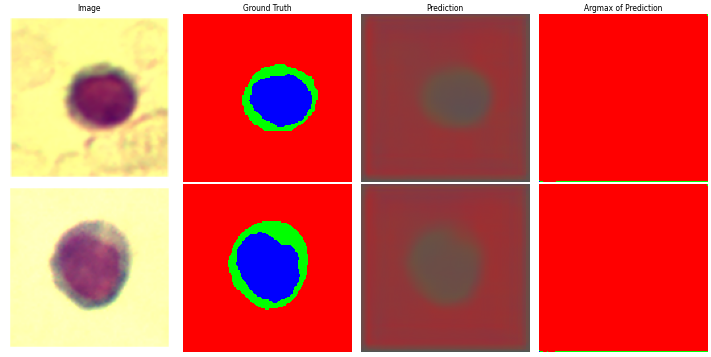

30/30 [==============================] - 21s 195ms/step - loss: 0.5564 - accuracy: 0.6805 - val_loss: 0.7944 - val_accuracy: 0.9926
Epoch 2/30
1/1 [==============================] - 0s 19ms/step


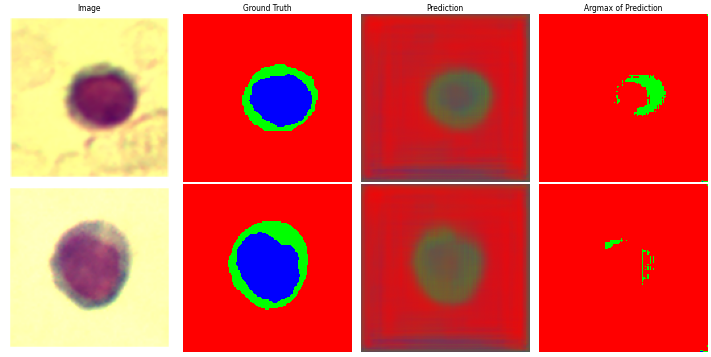

30/30 [==============================] - 3s 106ms/step - loss: 0.3603 - accuracy: 0.7265 - val_loss: 0.6109 - val_accuracy: 0.9792
Epoch 3/30
1/1 [==============================] - 0s 35ms/step


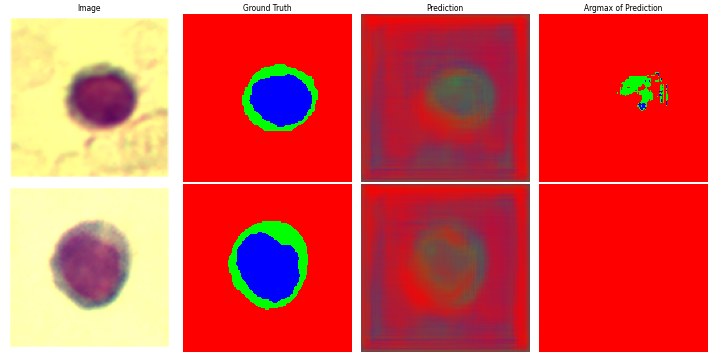

30/30 [==============================] - 4s 121ms/step - loss: 0.2676 - accuracy: 0.7270 - val_loss: 0.7274 - val_accuracy: 0.9871
Epoch 4/30
1/1 [==============================] - 0s 20ms/step


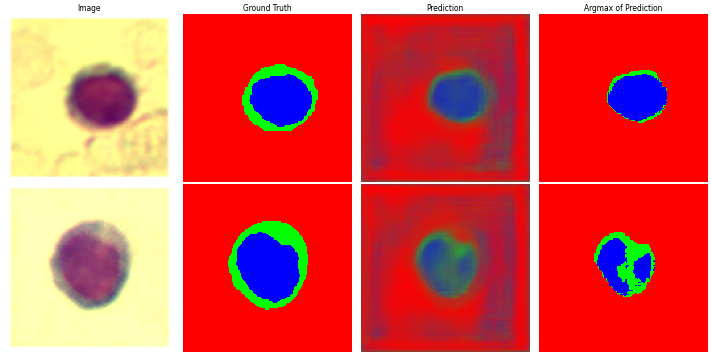

30/30 [==============================] - 3s 115ms/step - loss: 0.2060 - accuracy: 0.7262 - val_loss: 0.6097 - val_accuracy: 0.9021
Epoch 5/30
1/1 [==============================] - 0s 19ms/step


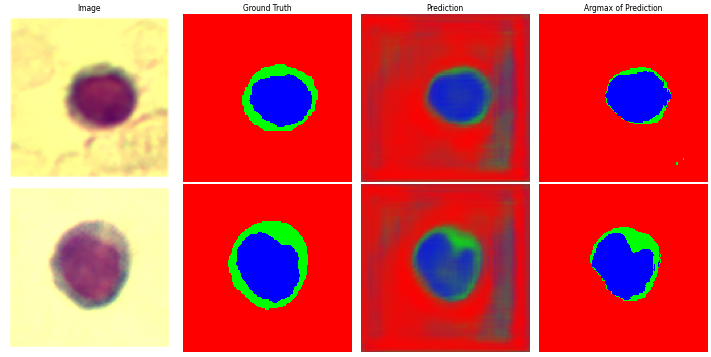

30/30 [==============================] - 3s 111ms/step - loss: 0.1676 - accuracy: 0.7267 - val_loss: 0.4920 - val_accuracy: 0.8400
Epoch 6/30
1/1 [==============================] - 0s 21ms/step


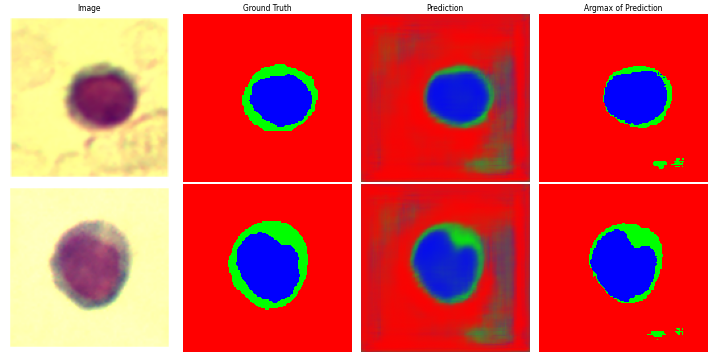

30/30 [==============================] - 3s 111ms/step - loss: 0.1406 - accuracy: 0.7270 - val_loss: 0.3673 - val_accuracy: 0.7819
Epoch 7/30
1/1 [==============================] - 0s 31ms/step


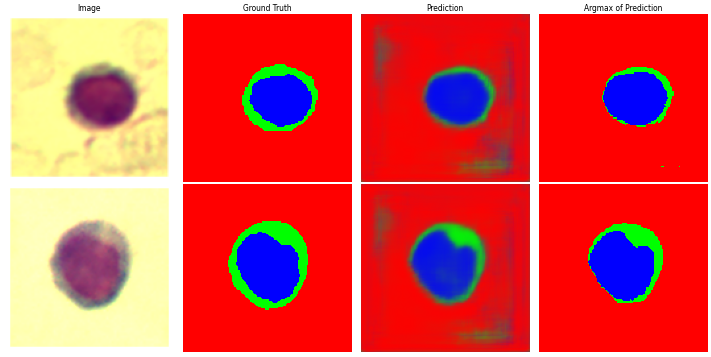

30/30 [==============================] - 4s 125ms/step - loss: 0.1226 - accuracy: 0.7269 - val_loss: 0.2961 - val_accuracy: 0.7811
Epoch 8/30
1/1 [==============================] - 0s 19ms/step


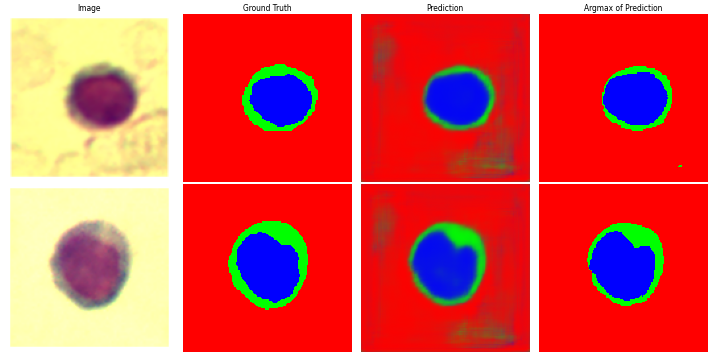

30/30 [==============================] - 4s 120ms/step - loss: 0.1095 - accuracy: 0.7271 - val_loss: 0.2208 - val_accuracy: 0.7566
Epoch 9/30
1/1 [==============================] - 0s 22ms/step


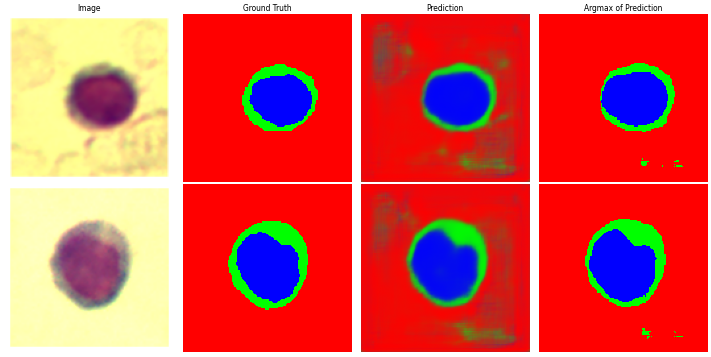

30/30 [==============================] - 3s 113ms/step - loss: 0.0951 - accuracy: 0.7267 - val_loss: 0.2229 - val_accuracy: 0.7274
Epoch 10/30
1/1 [==============================] - 0s 20ms/step


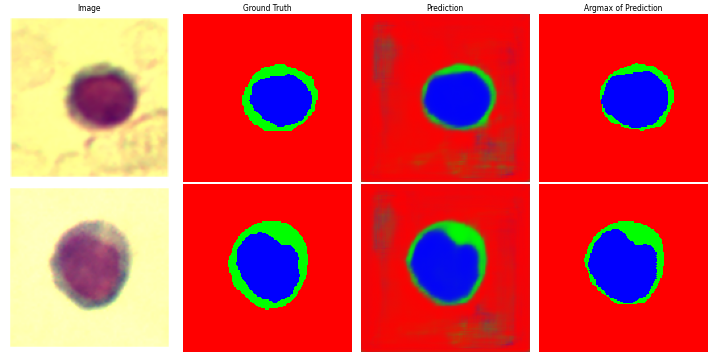

30/30 [==============================] - 3s 111ms/step - loss: 0.0854 - accuracy: 0.7268 - val_loss: 0.1974 - val_accuracy: 0.7420
Epoch 11/30
1/1 [==============================] - 0s 32ms/step


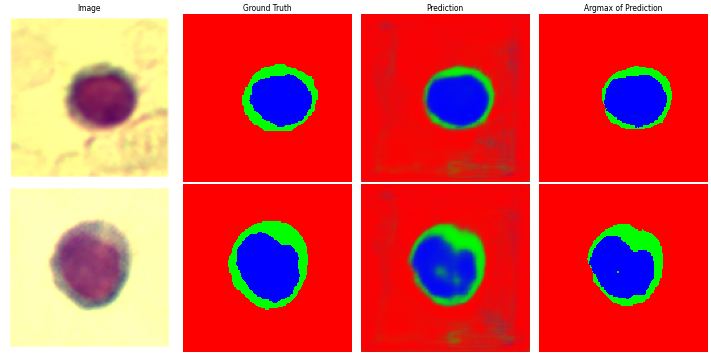

30/30 [==============================] - 4s 126ms/step - loss: 0.0779 - accuracy: 0.7269 - val_loss: 0.1882 - val_accuracy: 0.7625
Epoch 12/30
1/1 [==============================] - 0s 19ms/step


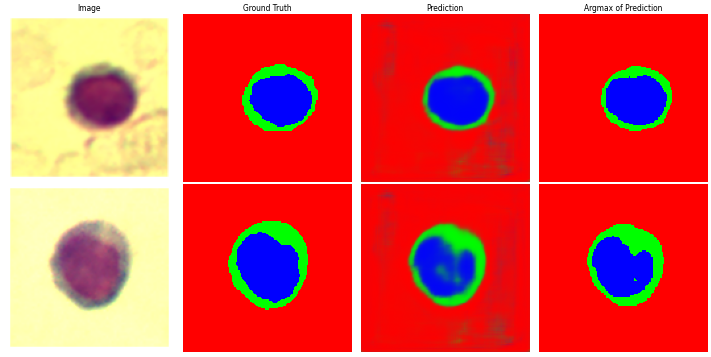

30/30 [==============================] - 3s 114ms/step - loss: 0.0746 - accuracy: 0.7271 - val_loss: 0.1649 - val_accuracy: 0.7560
Epoch 13/30
1/1 [==============================] - 0s 21ms/step


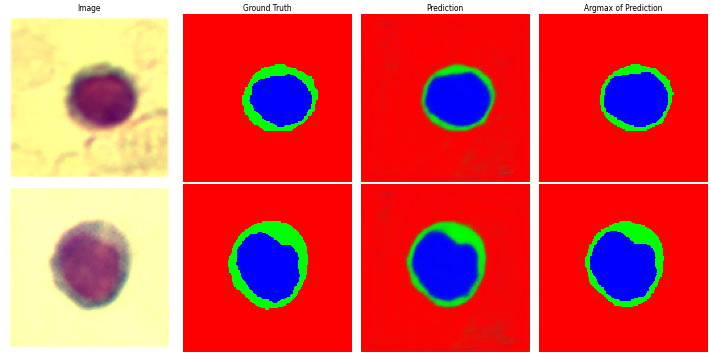

30/30 [==============================] - 3s 110ms/step - loss: 0.0705 - accuracy: 0.7272 - val_loss: 0.0980 - val_accuracy: 0.7404
Epoch 14/30
1/1 [==============================] - 0s 21ms/step


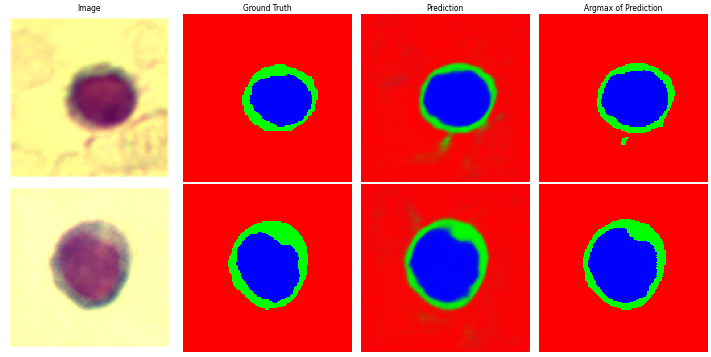

30/30 [==============================] - 3s 113ms/step - loss: 0.0656 - accuracy: 0.7268 - val_loss: 0.1525 - val_accuracy: 0.7194
Epoch 15/30
1/1 [==============================] - 0s 35ms/step


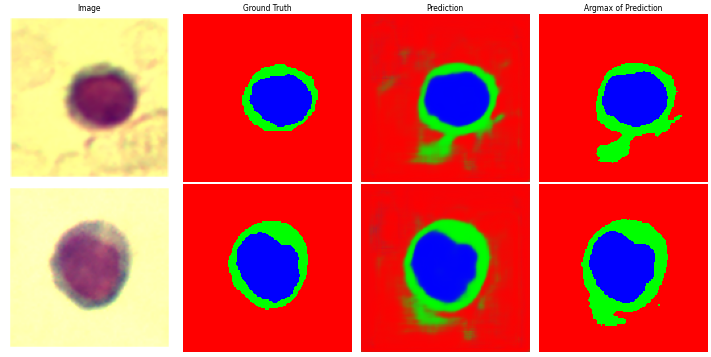

30/30 [==============================] - 4s 127ms/step - loss: 0.0597 - accuracy: 0.7268 - val_loss: 0.1462 - val_accuracy: 0.7042
Epoch 16/30
1/1 [==============================] - 0s 21ms/step


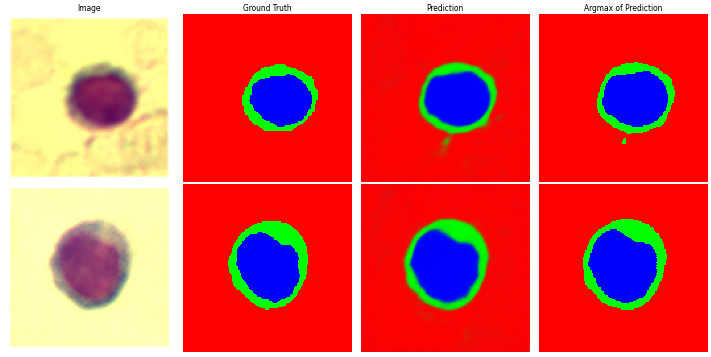

30/30 [==============================] - 3s 113ms/step - loss: 0.0559 - accuracy: 0.7270 - val_loss: 0.1074 - val_accuracy: 0.7194
Epoch 17/30
1/1 [==============================] - 0s 20ms/step


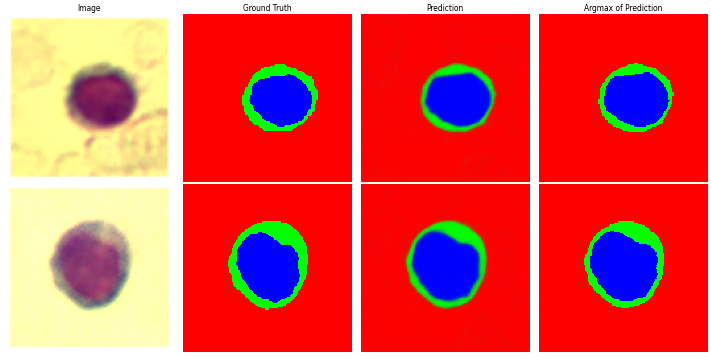

30/30 [==============================] - 4s 121ms/step - loss: 0.0530 - accuracy: 0.7272 - val_loss: 0.0749 - val_accuracy: 0.7338
Epoch 18/30
1/1 [==============================] - 0s 21ms/step


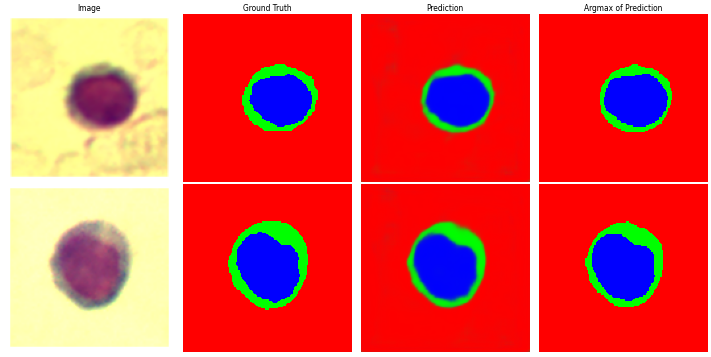

30/30 [==============================] - 3s 112ms/step - loss: 0.0496 - accuracy: 0.7272 - val_loss: 0.0887 - val_accuracy: 0.7431
Epoch 19/30
1/1 [==============================] - 0s 31ms/step


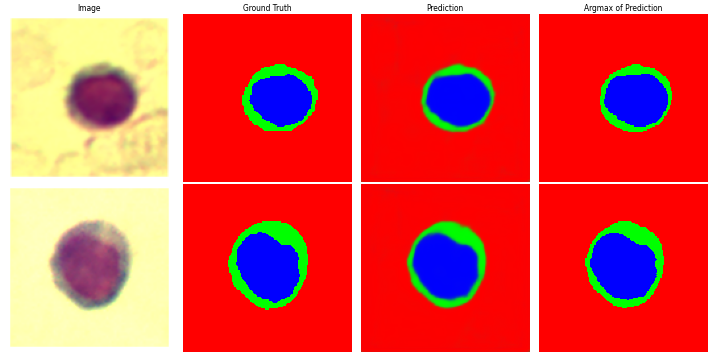

30/30 [==============================] - 4s 128ms/step - loss: 0.0473 - accuracy: 0.7271 - val_loss: 0.0763 - val_accuracy: 0.7386
Epoch 20/30
1/1 [==============================] - 0s 19ms/step


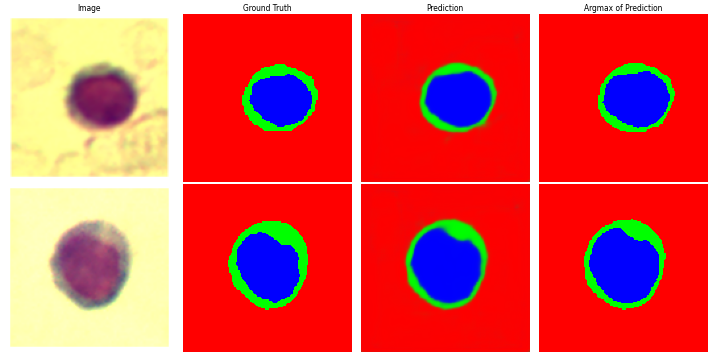

30/30 [==============================] - 3s 116ms/step - loss: 0.0463 - accuracy: 0.7270 - val_loss: 0.1099 - val_accuracy: 0.7257
Epoch 21/30
1/1 [==============================] - 0s 23ms/step


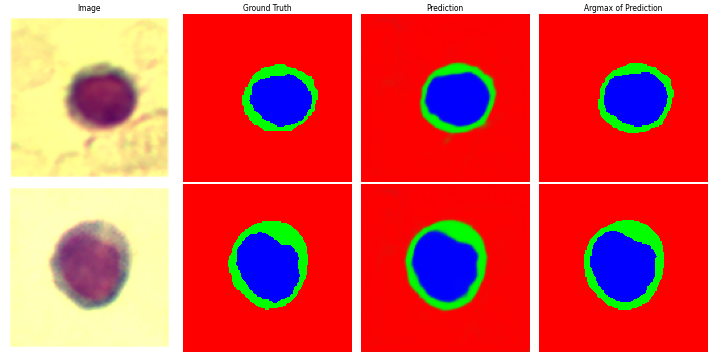

30/30 [==============================] - 3s 113ms/step - loss: 0.0463 - accuracy: 0.7271 - val_loss: 0.0719 - val_accuracy: 0.7259
Epoch 22/30
1/1 [==============================] - 0s 20ms/step


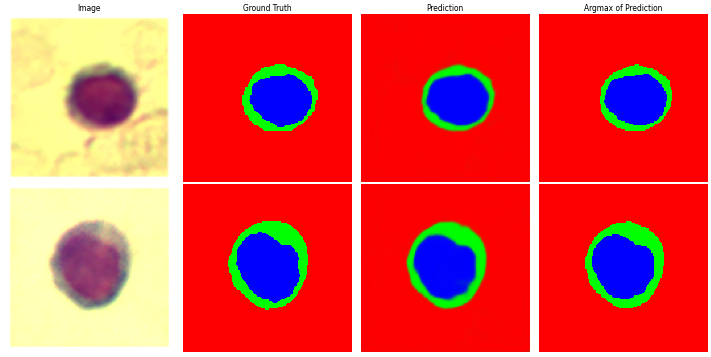

30/30 [==============================] - 3s 111ms/step - loss: 0.0437 - accuracy: 0.7269 - val_loss: 0.0706 - val_accuracy: 0.7424
Epoch 23/30
1/1 [==============================] - 0s 38ms/step


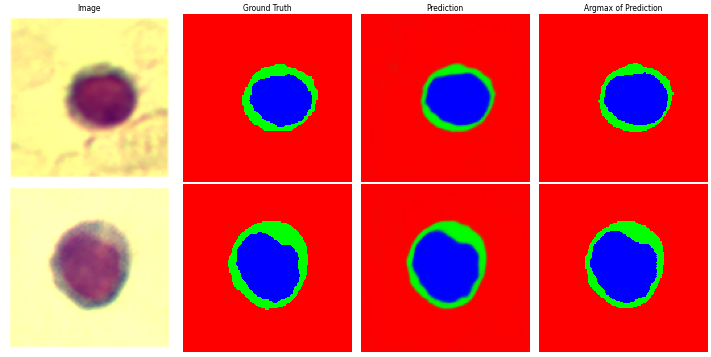

30/30 [==============================] - 4s 130ms/step - loss: 0.0430 - accuracy: 0.7268 - val_loss: 0.0556 - val_accuracy: 0.7372
Epoch 24/30
1/1 [==============================] - 0s 20ms/step


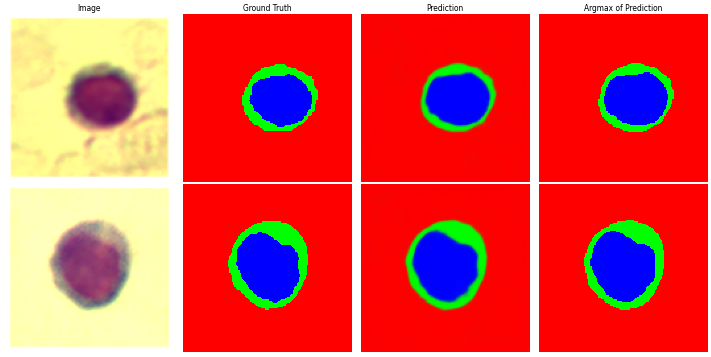

30/30 [==============================] - 3s 115ms/step - loss: 0.0428 - accuracy: 0.7269 - val_loss: 0.0553 - val_accuracy: 0.7329
Epoch 25/30
1/1 [==============================] - 0s 20ms/step


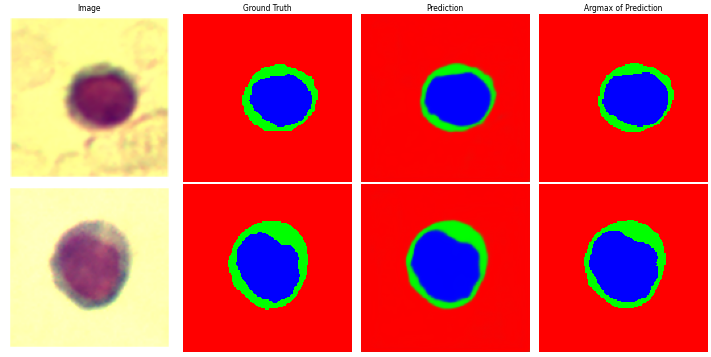

30/30 [==============================] - 4s 124ms/step - loss: 0.0399 - accuracy: 0.7271 - val_loss: 0.0631 - val_accuracy: 0.7349
Epoch 26/30
1/1 [==============================] - 0s 22ms/step


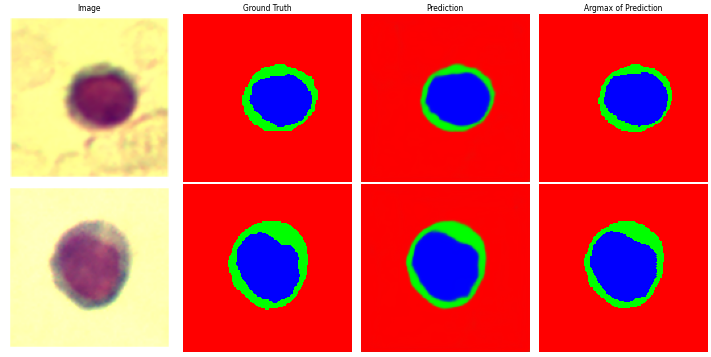

30/30 [==============================] - 3s 115ms/step - loss: 0.0391 - accuracy: 0.7271 - val_loss: 0.0687 - val_accuracy: 0.7397
Epoch 27/30
1/1 [==============================] - 0s 37ms/step


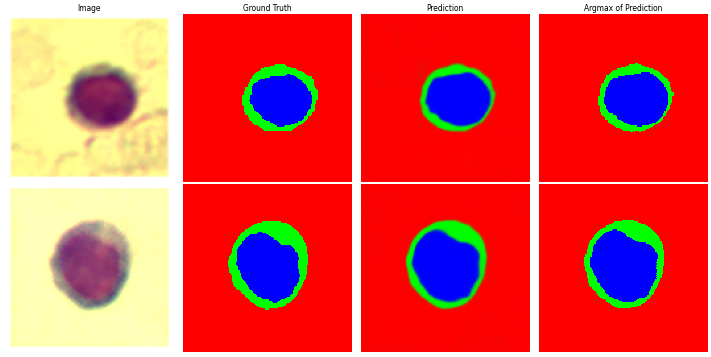

30/30 [==============================] - 4s 128ms/step - loss: 0.0369 - accuracy: 0.7267 - val_loss: 0.0649 - val_accuracy: 0.7388
Epoch 28/30
1/1 [==============================] - 0s 22ms/step


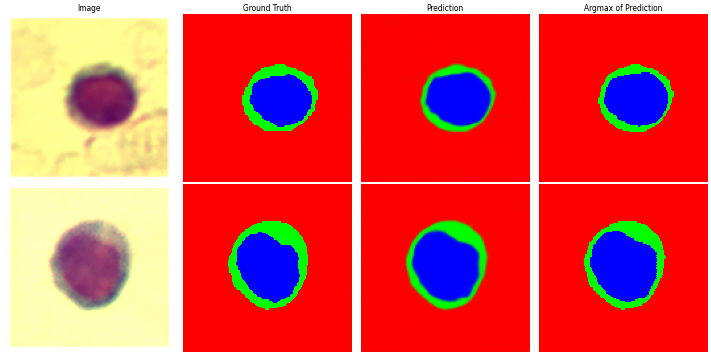

30/30 [==============================] - 3s 116ms/step - loss: 0.0353 - accuracy: 0.7271 - val_loss: 0.0645 - val_accuracy: 0.7398
Epoch 29/30
1/1 [==============================] - 0s 23ms/step


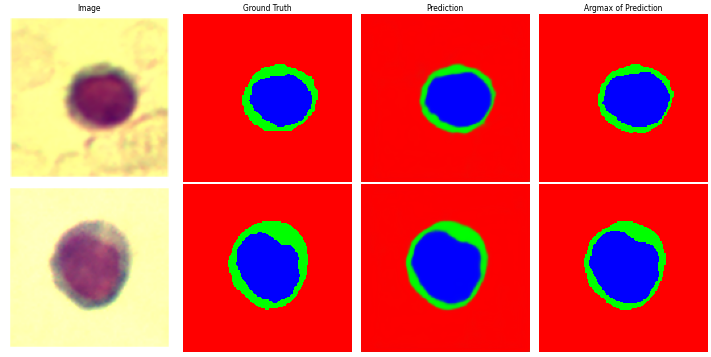

30/30 [==============================] - 3s 114ms/step - loss: 0.0346 - accuracy: 0.7270 - val_loss: 0.0829 - val_accuracy: 0.7368
Epoch 30/30
1/1 [==============================] - 0s 21ms/step


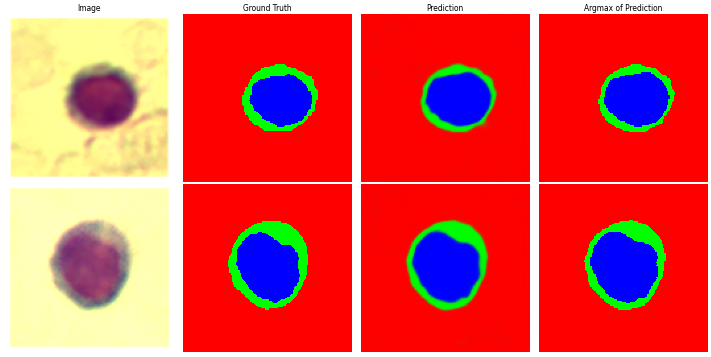

30/30 [==============================] - 3s 116ms/step - loss: 0.0337 - accuracy: 0.7269 - val_loss: 0.0689 - val_accuracy: 0.7355


In [15]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model.fit(
    train_generator,
    steps_per_epoch=240/BATCH_SIZE,
    epochs=30,
    validation_data=(val_generator),
    validation_steps=64/BATCH_SIZE,
    verbose=1,
    callbacks=[cnn_helper.PlottingKerasCallback(
        test_batch=next(val_generator),
        num_plot=2 # maximum num_plot is BATCH_SIZE
    )],
)

1/1 [==============================] - 0s 21ms/step


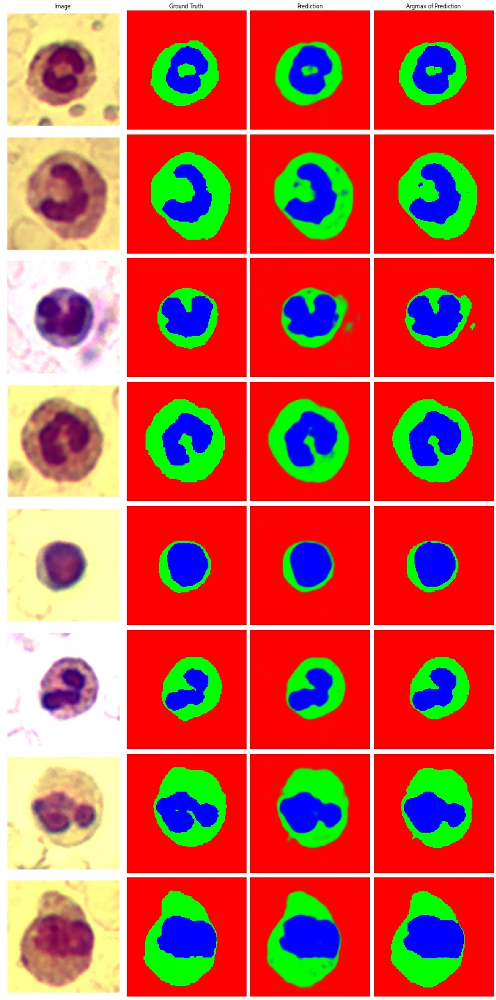

In [16]:
cnn_helper.plot_prediction (model, next(val_generator), BATCH_SIZE)

In [17]:
# Let's load the pretrained Unet model, using the VGG16 backbone
model = sm.Unet(
    'vgg16',
    encoder_weights='imagenet',
    classes=NUM_CLASSES,
    activation='softmax',
    input_shape=(IMG_SIZE,IMG_SIZE,3)
)

print (model.summary())

58889256/58889256 [==============================] - 0s 0us/step
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 128, 128, 64)         1792      ['input_3[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 128, 128, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)           0         ['block1_conv2[0][0]']        
                           

Epoch 1/30
 6/30 [=====>........................] - ETA: 2s - loss: 0.9016 - accuracy: 0.6806

1/1 [==============================] - 0s 321ms/step


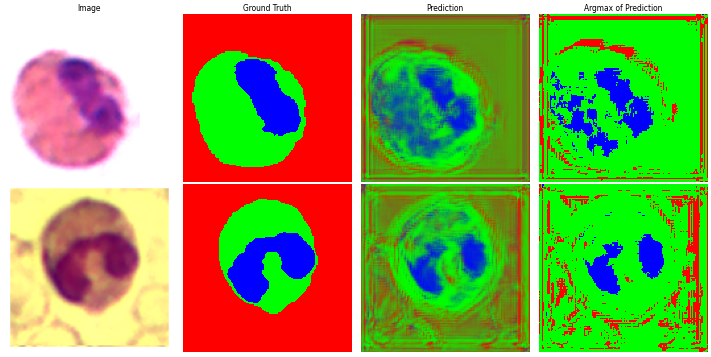

30/30 [==============================] - 14s 135ms/step - loss: 0.6502 - accuracy: 0.7145 - val_loss: 0.9569 - val_accuracy: 0.1623
Epoch 2/30
1/1 [==============================] - 0s 20ms/step


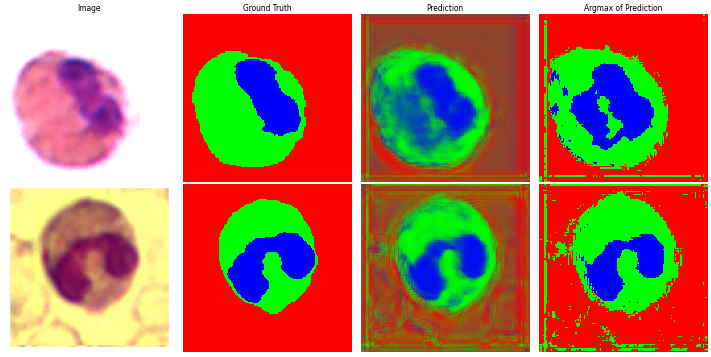

30/30 [==============================] - 3s 108ms/step - loss: 0.3625 - accuracy: 0.7274 - val_loss: 0.4986 - val_accuracy: 0.6637
Epoch 3/30
1/1 [==============================] - 0s 33ms/step


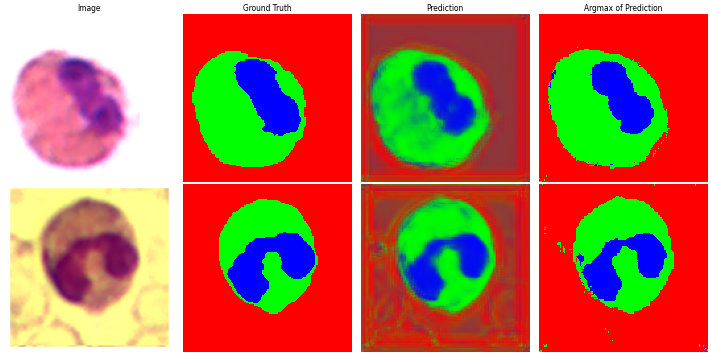

30/30 [==============================] - 4s 123ms/step - loss: 0.2410 - accuracy: 0.7238 - val_loss: 0.3750 - val_accuracy: 0.7204
Epoch 4/30
1/1 [==============================] - 0s 27ms/step


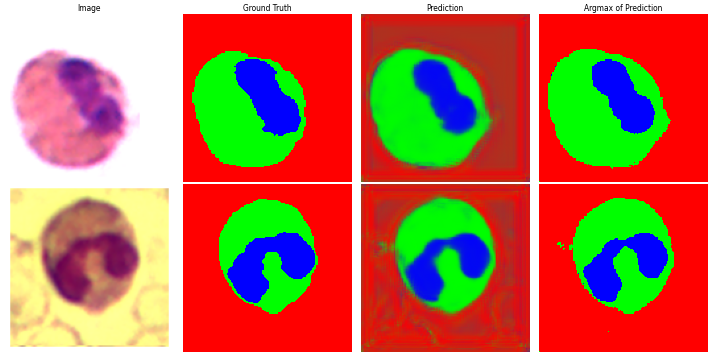

30/30 [==============================] - 3s 112ms/step - loss: 0.1802 - accuracy: 0.7253 - val_loss: 0.2928 - val_accuracy: 0.7040
Epoch 5/30
1/1 [==============================] - 0s 21ms/step


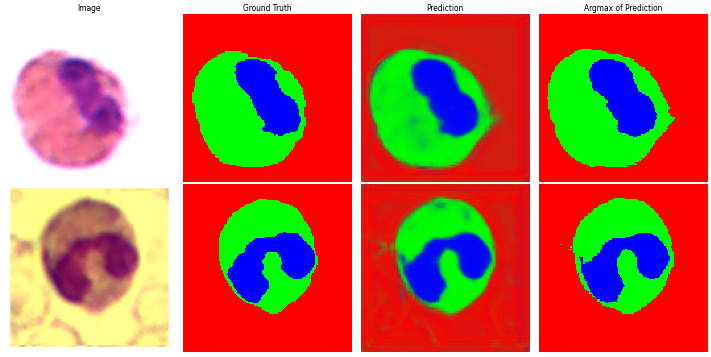

30/30 [==============================] - 4s 120ms/step - loss: 0.1429 - accuracy: 0.7259 - val_loss: 0.1991 - val_accuracy: 0.7108
Epoch 6/30
1/1 [==============================] - 0s 22ms/step


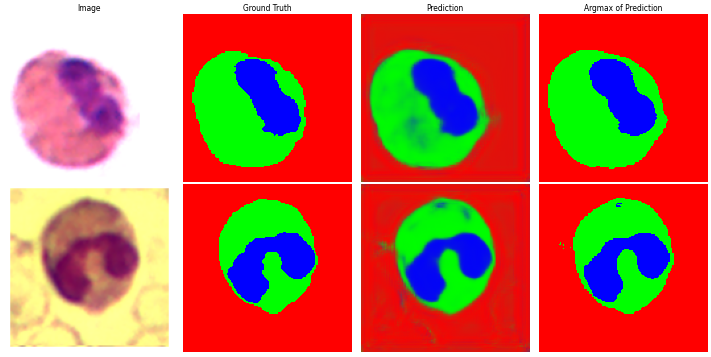

30/30 [==============================] - 3s 110ms/step - loss: 0.1193 - accuracy: 0.7263 - val_loss: 0.1609 - val_accuracy: 0.7172
Epoch 7/30
1/1 [==============================] - 0s 32ms/step


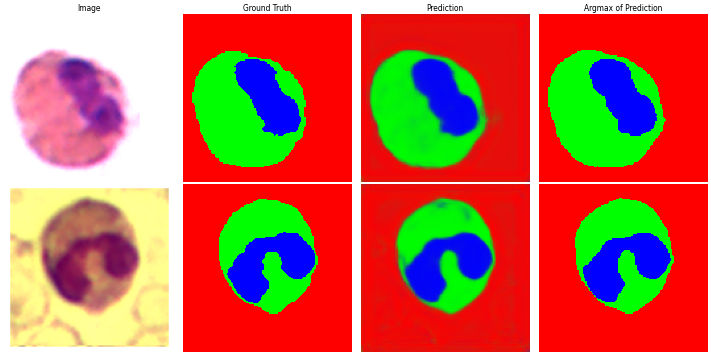

30/30 [==============================] - 4s 126ms/step - loss: 0.1026 - accuracy: 0.7263 - val_loss: 0.1192 - val_accuracy: 0.7282
Epoch 8/30
1/1 [==============================] - 0s 24ms/step


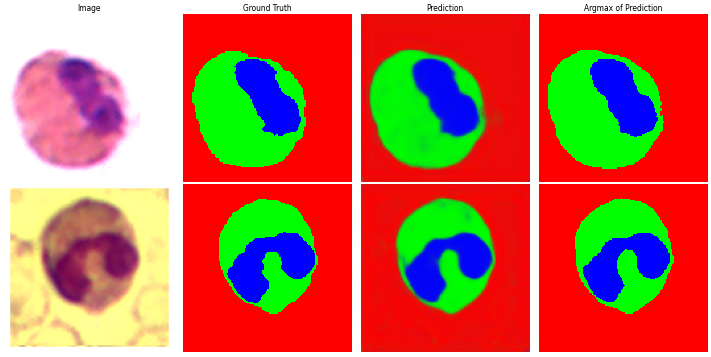

30/30 [==============================] - 3s 115ms/step - loss: 0.0910 - accuracy: 0.7267 - val_loss: 0.1037 - val_accuracy: 0.7263
Epoch 9/30
1/1 [==============================] - 0s 20ms/step


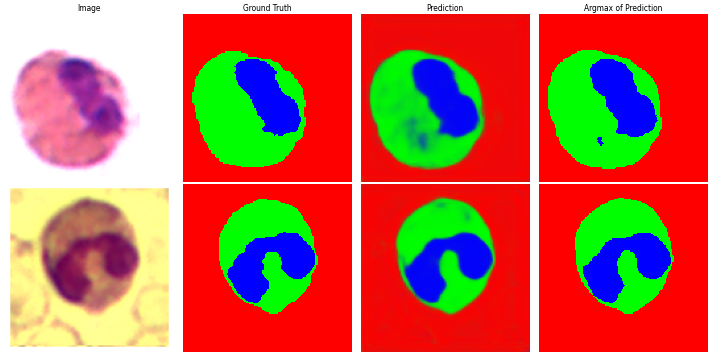

30/30 [==============================] - 3s 109ms/step - loss: 0.0821 - accuracy: 0.7265 - val_loss: 0.0952 - val_accuracy: 0.7265
Epoch 10/30
1/1 [==============================] - 0s 19ms/step


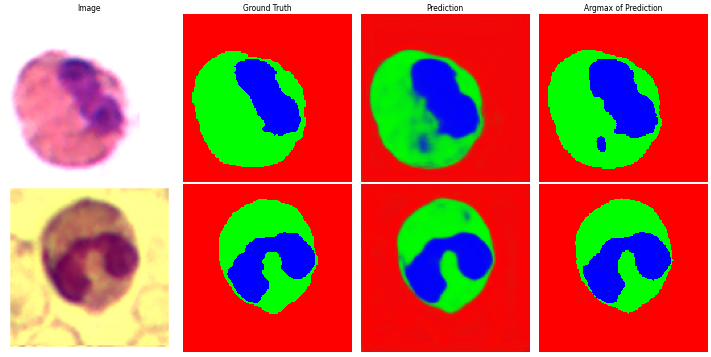

30/30 [==============================] - 3s 110ms/step - loss: 0.0747 - accuracy: 0.7267 - val_loss: 0.0892 - val_accuracy: 0.7334
Epoch 11/30
1/1 [==============================] - 0s 35ms/step


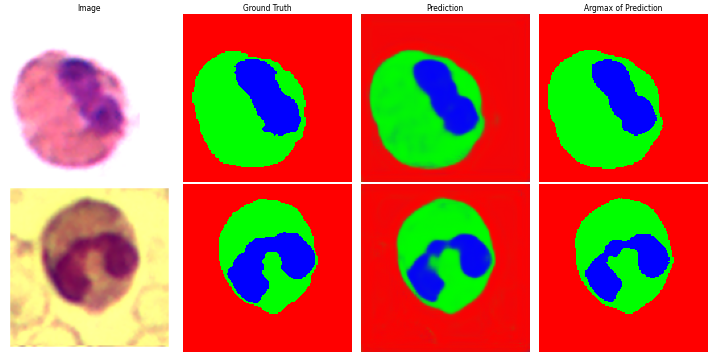

30/30 [==============================] - 4s 123ms/step - loss: 0.0681 - accuracy: 0.7265 - val_loss: 0.0902 - val_accuracy: 0.7313
Epoch 12/30
1/1 [==============================] - 0s 23ms/step


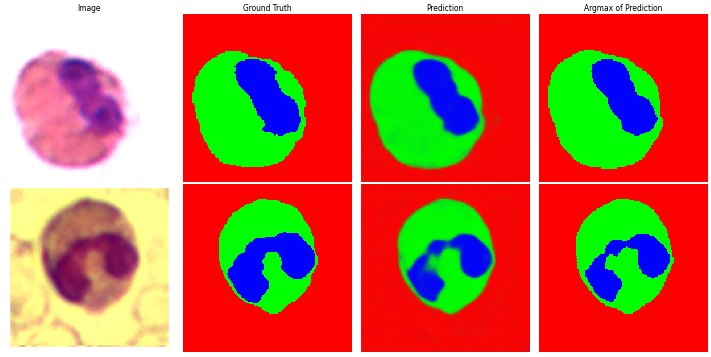

30/30 [==============================] - 3s 115ms/step - loss: 0.0628 - accuracy: 0.7265 - val_loss: 0.0880 - val_accuracy: 0.7320
Epoch 13/30
1/1 [==============================] - 0s 25ms/step


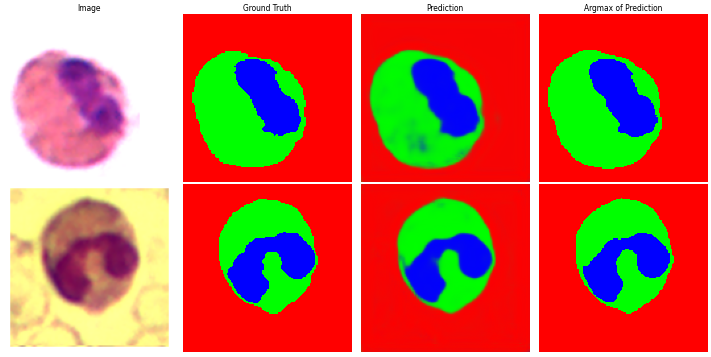

30/30 [==============================] - 3s 116ms/step - loss: 0.0590 - accuracy: 0.7268 - val_loss: 0.0685 - val_accuracy: 0.7322
Epoch 14/30
1/1 [==============================] - 0s 31ms/step


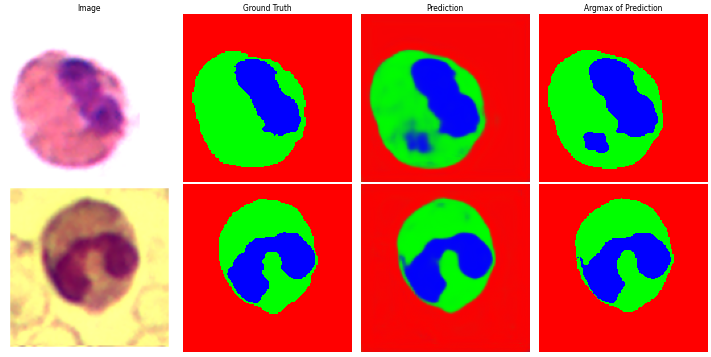

30/30 [==============================] - 4s 139ms/step - loss: 0.0555 - accuracy: 0.7266 - val_loss: 0.0725 - val_accuracy: 0.7298
Epoch 15/30
1/1 [==============================] - 0s 21ms/step


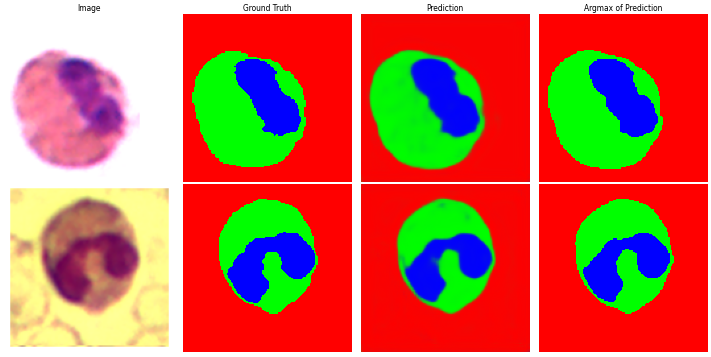

30/30 [==============================] - 3s 116ms/step - loss: 0.0514 - accuracy: 0.7267 - val_loss: 0.0637 - val_accuracy: 0.7303
Epoch 16/30
1/1 [==============================] - 0s 21ms/step


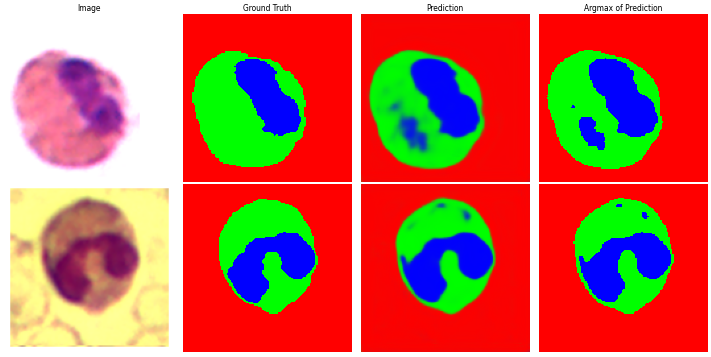

30/30 [==============================] - 3s 111ms/step - loss: 0.0487 - accuracy: 0.7267 - val_loss: 0.0770 - val_accuracy: 0.7259
Epoch 17/30
1/1 [==============================] - 0s 20ms/step


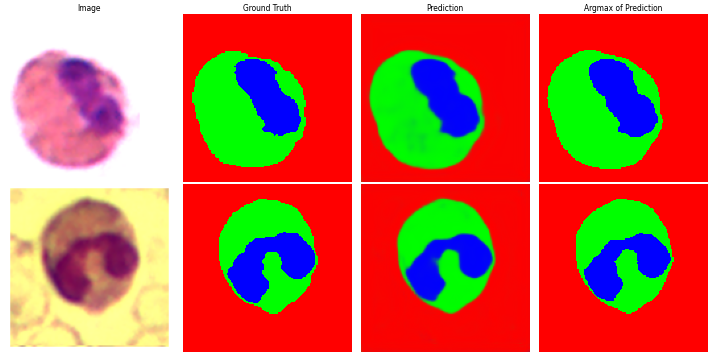

30/30 [==============================] - 3s 111ms/step - loss: 0.0472 - accuracy: 0.7267 - val_loss: 0.0598 - val_accuracy: 0.7300
Epoch 18/30
1/1 [==============================] - 0s 31ms/step


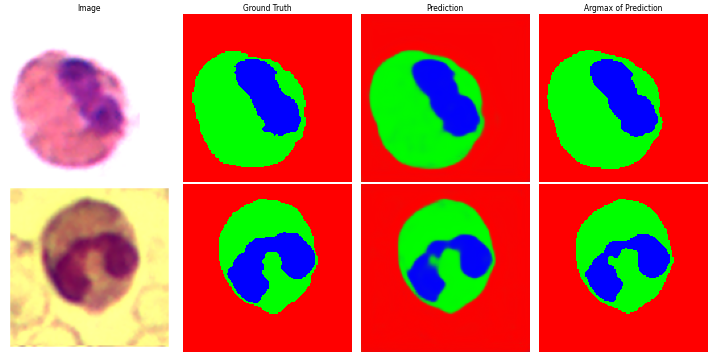

30/30 [==============================] - 4s 125ms/step - loss: 0.0444 - accuracy: 0.7267 - val_loss: 0.0568 - val_accuracy: 0.7337
Epoch 19/30
1/1 [==============================] - 0s 19ms/step


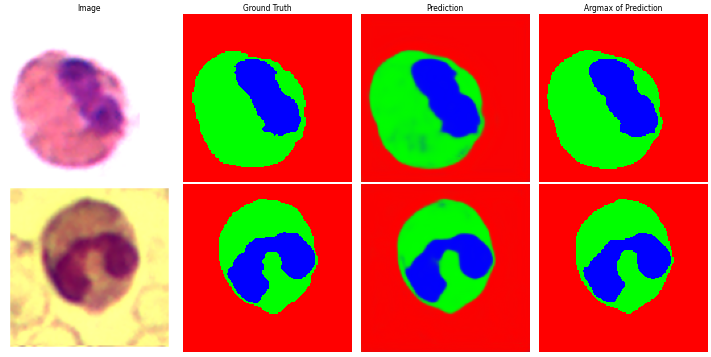

30/30 [==============================] - 3s 114ms/step - loss: 0.0429 - accuracy: 0.7267 - val_loss: 0.0531 - val_accuracy: 0.7340
Epoch 20/30
1/1 [==============================] - 0s 20ms/step


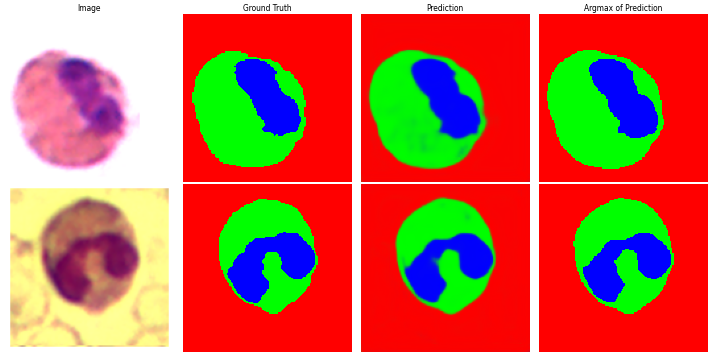

30/30 [==============================] - 3s 111ms/step - loss: 0.0403 - accuracy: 0.7269 - val_loss: 0.0604 - val_accuracy: 0.7260
Epoch 21/30
1/1 [==============================] - 0s 51ms/step


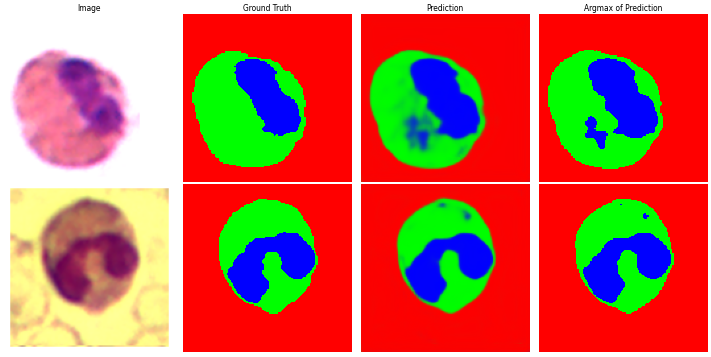

30/30 [==============================] - 4s 123ms/step - loss: 0.0385 - accuracy: 0.7267 - val_loss: 0.0598 - val_accuracy: 0.7310
Epoch 22/30
1/1 [==============================] - 0s 28ms/step


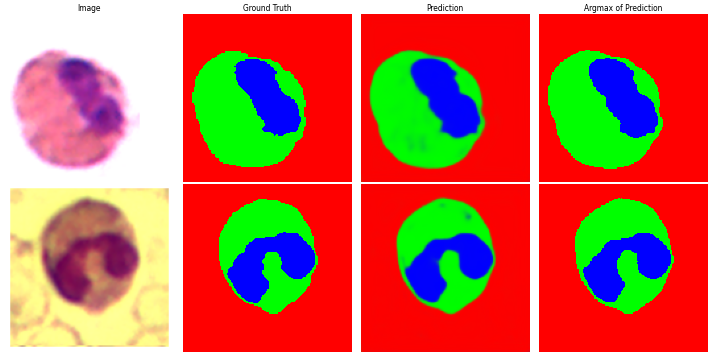

30/30 [==============================] - 4s 128ms/step - loss: 0.0372 - accuracy: 0.7267 - val_loss: 0.0532 - val_accuracy: 0.7321
Epoch 23/30
1/1 [==============================] - 0s 20ms/step


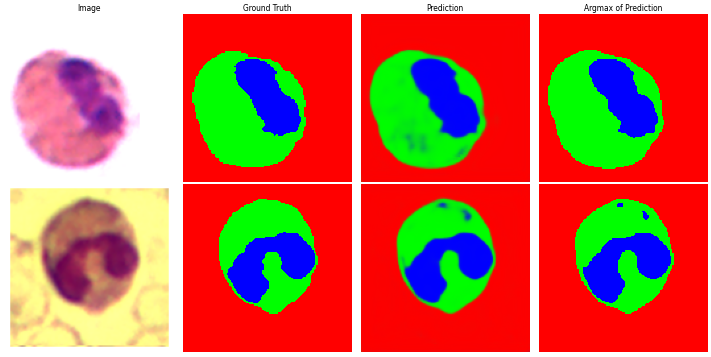

30/30 [==============================] - 3s 115ms/step - loss: 0.0364 - accuracy: 0.7269 - val_loss: 0.0567 - val_accuracy: 0.7291
Epoch 24/30
1/1 [==============================] - 0s 19ms/step


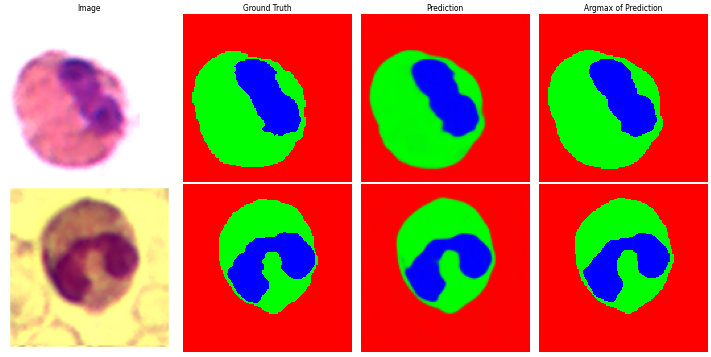

30/30 [==============================] - 4s 130ms/step - loss: 0.0356 - accuracy: 0.7270 - val_loss: 0.0489 - val_accuracy: 0.7327
Epoch 25/30
1/1 [==============================] - 0s 21ms/step


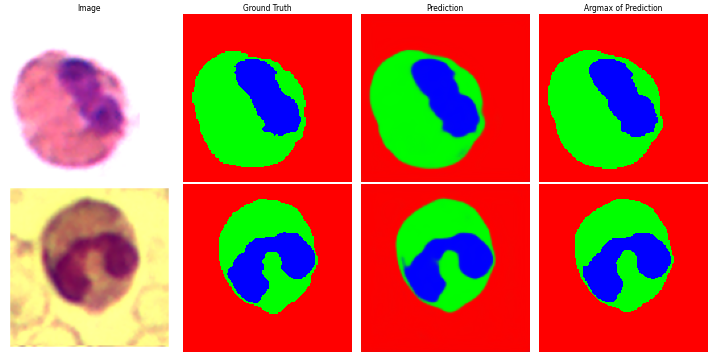

30/30 [==============================] - 3s 114ms/step - loss: 0.0340 - accuracy: 0.7268 - val_loss: 0.0522 - val_accuracy: 0.7306
Epoch 26/30
1/1 [==============================] - 0s 33ms/step


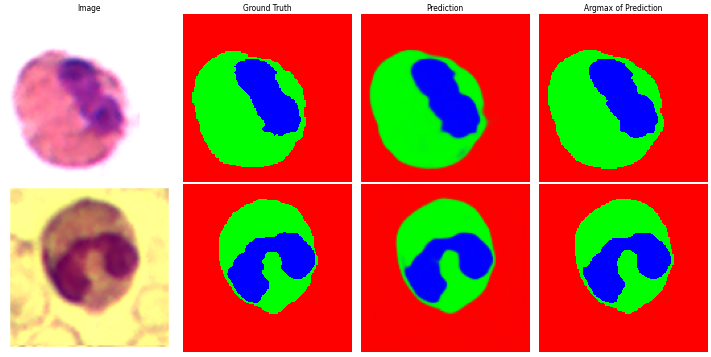

30/30 [==============================] - 4s 131ms/step - loss: 0.0329 - accuracy: 0.7267 - val_loss: 0.0548 - val_accuracy: 0.7283
Epoch 27/30
1/1 [==============================] - 0s 19ms/step


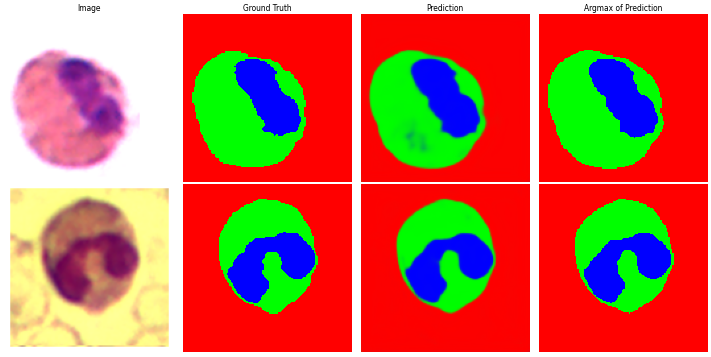

30/30 [==============================] - 4s 118ms/step - loss: 0.0319 - accuracy: 0.7270 - val_loss: 0.0510 - val_accuracy: 0.7289
Epoch 28/30
1/1 [==============================] - 0s 22ms/step


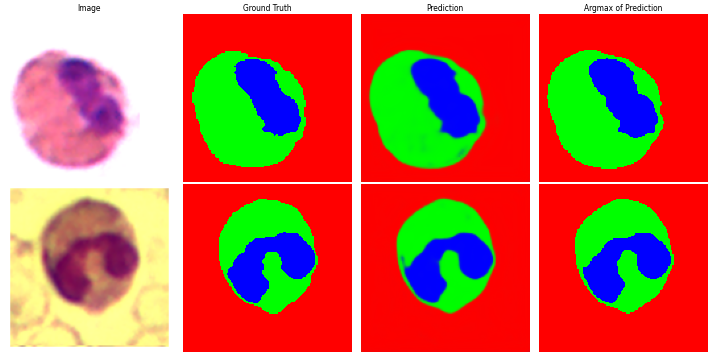

30/30 [==============================] - 3s 115ms/step - loss: 0.0305 - accuracy: 0.7269 - val_loss: 0.0485 - val_accuracy: 0.7326
Epoch 29/30
1/1 [==============================] - 0s 21ms/step


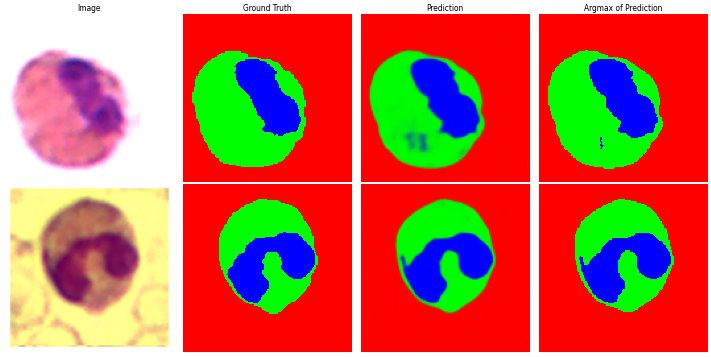

30/30 [==============================] - 3s 117ms/step - loss: 0.0291 - accuracy: 0.7268 - val_loss: 0.0497 - val_accuracy: 0.7345
Epoch 30/30
1/1 [==============================] - 0s 47ms/step


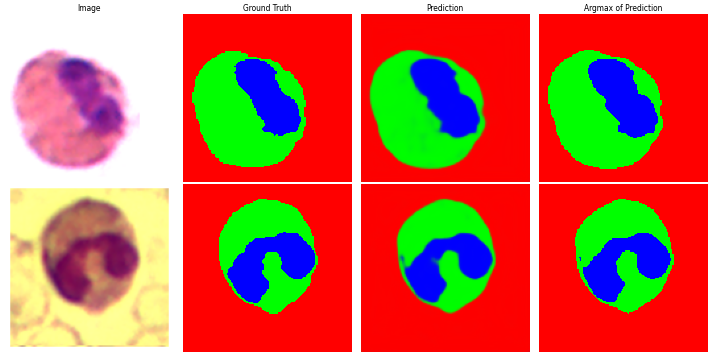

30/30 [==============================] - 4s 133ms/step - loss: 0.0289 - accuracy: 0.7270 - val_loss: 0.0511 - val_accuracy: 0.7322


In [18]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model.fit(
    train_generator,
    steps_per_epoch=240/BATCH_SIZE,
    epochs=30,
    validation_data=(val_generator),
    validation_steps=64/BATCH_SIZE,
    verbose=1,
    callbacks=[cnn_helper.PlottingKerasCallback(
        test_batch=next(val_generator),
        num_plot=2 # maximum num_plot is BATCH_SIZE
    )],
)

1/1 [==============================] - 0s 20ms/step


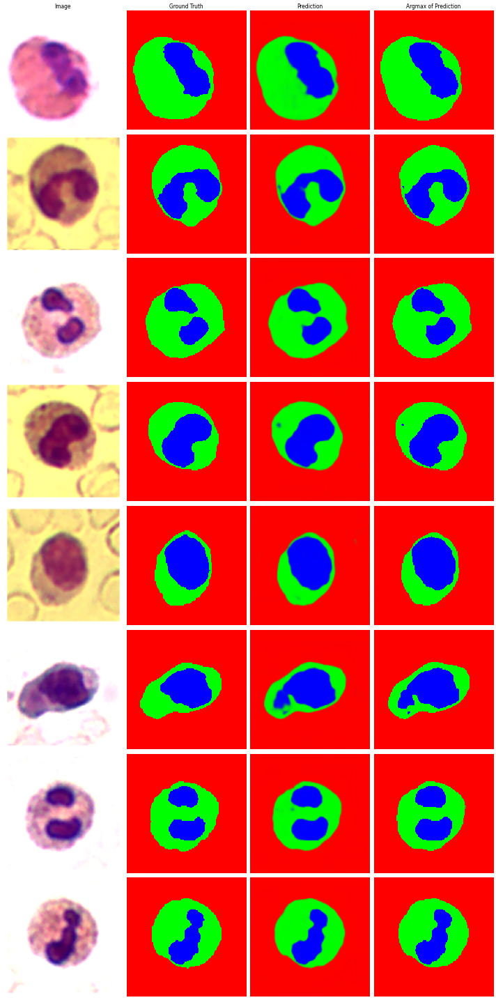

In [19]:
cnn_helper.plot_prediction (model, next(val_generator), BATCH_SIZE)